<a href="https://colab.research.google.com/github/DEBISMITADEY/Automatic-Fire-Detection-System/blob/main/detection_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install mplcyberpunk

In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import mplcyberpunk
import cv2
import tensorflow as tf
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Dropout, Dense, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
from warnings import filterwarnings
# Set style for plots
plt.style.use("cyberpunk")

In [ ]:
import io
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import cv2
from sklearn.utils import shuffle
import tensorflow as tf

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/brain_tumor.zip -d /content/drive/MyDrive/Major_Project1

Archive:  /content/drive/MyDrive/brain_tumor.zip
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(1).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(10).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(100).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(11).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(12).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(13).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(14).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(15).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(16).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(17).jpg  
  inflating: /content/drive/MyDrive/Major_Project1/Testing/glioma_tumor

In [ ]:
TRAINING_PATH = '/content/drive/MyDrive/Major_Project1/Training'
TESTING_PATH = '/content/drive/MyDrive/Major_Project1/Testing'
IMAGE_SIZE = 150
LABELS = ['glioma_tumor', 'no_tumor', 'meningioma_tumor', 'pituitary_tumor']

def load_images_from_folder(folder_path, labels, image_size):
    """Load and preprocess images from specified folder path."""
    X = []
    y = []

    for label in labels:
        label_folder_path = os.path.join(folder_path, label)
        # Check if folder exists
        if not os.path.exists(label_folder_path):
            print(f"Warning: {label_folder_path} does not exist.")
            continue

        for filename in tqdm(os.listdir(label_folder_path), desc=f"Loading {label} images"):
            img_path = os.path.join(label_folder_path, filename)

            # Try to read the image
            try:
                img = cv2.imread(img_path)
                img = cv2.resize(img, (image_size, image_size))
                X.append(img)
                y.append(label)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")

    return np.array(X), np.array(y)

# Load training and testing images
X_train, y_train = load_images_from_folder(TRAINING_PATH, LABELS, IMAGE_SIZE)
X_test, y_test = load_images_from_folder(TESTING_PATH, LABELS, IMAGE_SIZE)

# Verify the shapes of the resulting arrays
print(f"Training data shape: {X_train.shape}, Training labels shape: {y_train.shape}")
print(f"Testing data shape: {X_test.shape}, Testing labels shape: {y_test.shape}")


Loading pituitary_tumor images: 100%|██████████| 74/74 [00:38<00:00,  1.93it/s]

Training data shape: (2870, 150, 150, 3), Training labels shape: (2870,)
Testing data shape: (394, 150, 150, 3), Testing labels shape: (394,)


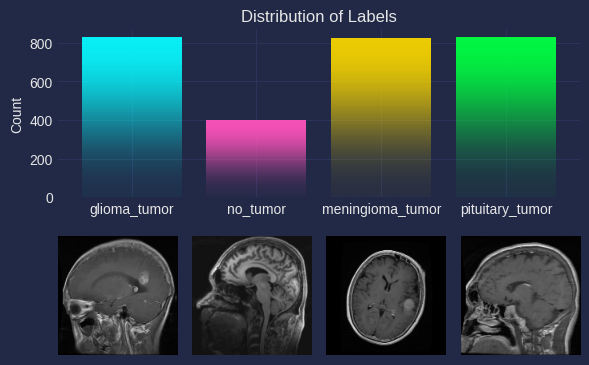

In [ ]:
import matplotlib.pyplot as plt
import mplcyberpunk

def plot_label_distribution_and_samples(X, y, labels, num_samples=1, colors=None):
    # Calculate the count of each label
    label_counts = {label: np.sum(y == label) for label in labels}

    # Set default colors if not provided
    if colors is None:
        colors = ["C0", "C1", "C2", "C3"]

    # Create a figure for the plots
    plt.figure(figsize=(6, 4))

    # Plot the histogram
    plt.subplot(2, 1, 1)
    bars = plt.bar(label_counts.keys(), label_counts.values(), color=colors)
    mplcyberpunk.add_bar_gradient(bars=bars)
    plt.ylabel('Count')
    plt.title('Distribution of Labels')

    # Plot sample images from each label
    for k, label in enumerate(labels):
        count = 0
        for j in range(len(y)):
            if y[j] == label and count < num_samples:
                plt.subplot(2, 4, k + 5)
                plt.imshow(X[j])
                plt.axis('off')
                count += 1


    plt.tight_layout()
    plt.show()

# Call the function to plot label distribution and samples
plot_label_distribution_and_samples(X_train, y_train, LABELS, num_samples=2)

In [ ]:
def preprocess_data(X: np.ndarray, y: np.ndarray, labels: list, test_size: float = 0.2, random_state: int = 101) -> tuple:
    # Shuffle the data
    X, y = shuffle(X, y, random_state=random_state)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Convert labels to indices and one-hot encode them
    y_train = tf.keras.utils.to_categorical([labels.index(label) for label in y_train])
    y_test = tf.keras.utils.to_categorical([labels.index(label) for label in y_test])

    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = preprocess_data(X_train, y_train, LABELS)

In [ ]:
# Load the EfficientNetB0 model pretrained on ImageNet without the top layers
efficientnetB0 = tf.keras.applications.EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)
)

# Build the custom model on top of the EfficientNetB0 base
x = efficientnetB0.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(rate=0.4)(x)
x = tf.keras.layers.Dense(len(LABELS), activation='softmax')(x)  # Use number of classes dynamically

# Create the complete model
model = tf.keras.models.Model(inputs=efficientnetB0.input, outputs=x)

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print the model summary
model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 150, 150, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 150, 150, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 150, 150, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 150, 150, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 151, 151, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 75, 75, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 75, 75, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 75, 75, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 75, 75, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 75, 75, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 75, 75, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand    

 Total params: 5,365,415 (20.47 MB)

 Trainable params: 5,323,392 (20.31 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
# TensorBoard callback for logging training metrics
tensorboard_callback = TensorBoard(log_dir='logs')

# ModelCheckpoint callback to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath="efficientnetB0.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)
# ReduceLROnPlateau callback to reduce learning rate if validation accuracy plateaus
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.1,
    patience=2,
    min_delta=0.0001,
    verbose=1
)

In [ ]:
# Train the model
history = model.fit(
    X_train,
    y_train,
    validation_split=0.1,
    epochs=20,
    batch_size=32,
    verbose=1,
    callbacks=[tensorboard_callback, checkpoint_callback, reduce_lr_callback]
)

Epoch 1/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 754ms/step - accuracy: 0.6896 - loss: 0.7502
Epoch 1: val_accuracy improved from -inf to 0.79130, saving model to efficientnetB0.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 140s 960ms/step - accuracy: 0.6912 - loss: 0.7467 - val_accuracy: 0.7913 - val_loss: 0.7672 - learning_rate: 0.0010
Epoch 2/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9397 - loss: 0.1852
Epoch 2: val_accuracy improved from 0.79130 to 0.90435, saving model to efficientnetB0.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - accuracy: 0.9396 - loss: 0.1852 - val_accuracy: 0.9043 - val_loss: 0.3426 - learning_rate: 0.0010
Epoch 3/20
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.9480 - loss: 0.1543
Epoch 3: val_accuracy did not improve from 0.90435
65/65 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9479 - loss: 0.1552 - val_accuracy: 0.8870 - val_loss: 0.4957 - learning_rate: 0.0010
Epoch 4/20
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9413 - loss: 0.1619
E

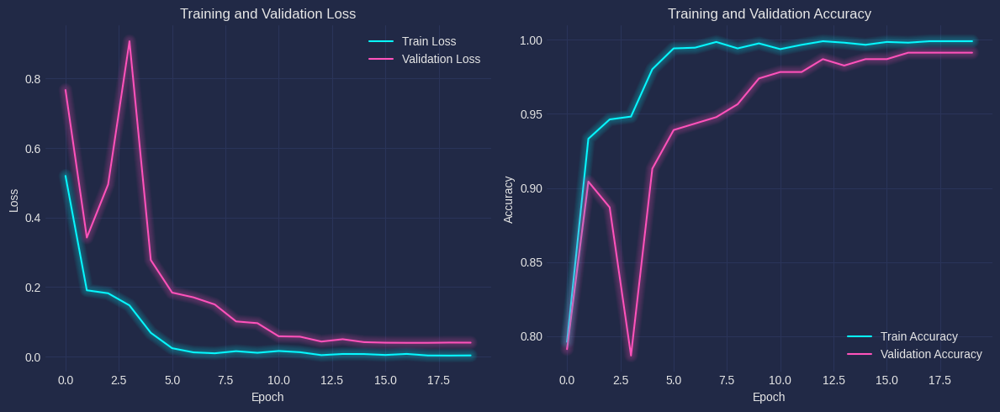

In [ ]:
# Plotting training and validation loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
mplcyberpunk.make_lines_glow()

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
mplcyberpunk.make_lines_glow()

plt.tight_layout()
plt.show()

18/18 ━━━━━━━━━━━━━━━━━━━━ 15s 547ms/step


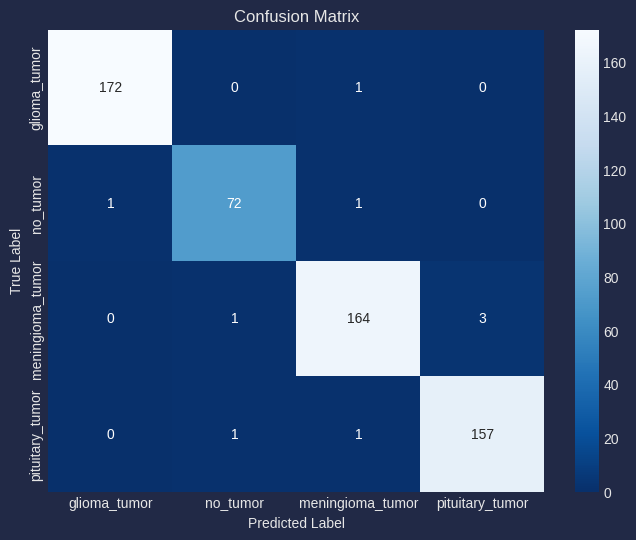

In [ ]:
# Calculate predictions and true labels for test data
y_true_test = np.argmax(y_test, axis=1)
y_pred_test = np.argmax(model.predict(X_test), axis=1)

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(
    confusion_matrix(y_true_test, y_pred_test),
    annot=True,
    fmt='d',
    cmap='Blues_r',
    xticklabels=LABELS,  # Use defined LABELS for axis ticks
    yticklabels=LABELS
)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
# Define the path to save the model in Google Drive
drive_model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'

# Save the model to the specified path
model.save(drive_model_path)

print(f"Model saved at: {drive_model_path}")


Model saved at: /content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5


In [ ]:
from tensorflow.keras.models import load_model

# Path to the saved model
drive_model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'

# Load the model
saved_model = load_model(drive_model_path)

print("Model loaded successfully!")


Model loaded successfully!


In [ ]:
# Print classification report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       173
           1       0.97      0.97      0.97        74
           2       0.98      0.98      0.98       168
           3       0.98      0.99      0.98       159

    accuracy                           0.98       574
   macro avg       0.98      0.98      0.98       574
weighted avg       0.98      0.98      0.98       574



1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Predicted label (Image 1): pituitary_tumor
Actual label (Image 1): pituitary_tumor
Confidence (Image 1): 100.00%

Predicted label (Image 2): glioma_tumor
Actual label (Image 2): glioma_tumor
Confidence (Image 2): 100.00%

Predicted label (Image 3): pituitary_tumor
Actual label (Image 3): pituitary_tumor
Confidence (Image 3): 100.00%



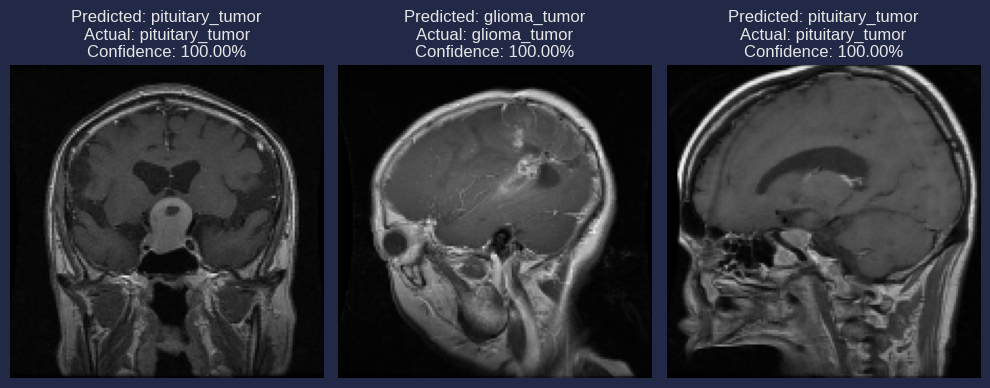

In [ ]:
# Select 3 random indices from the test set
random_indices = np.random.choice(len(X_test), size=3, replace=False)
random_imgs = X_test[random_indices]
predictions = model.predict(random_imgs.reshape(3, IMAGE_SIZE, IMAGE_SIZE, 3))  # Reshape for model input

# Prepare lists for predicted and actual labels and confidences
predicted_labels = []
actual_labels = []
confidences = []

# Interpret the model's predictions for each random image
for i in range(3):
    predicted_class = np.argmax(predictions[i])  # Index of the class with the highest probability
    predicted_labels.append(LABELS[predicted_class])  # Convert index to label
    confidences.append(predictions[i][predicted_class])  # Confidence score

    actual_index = y_test[random_indices[i]]  # One-hot encoded actual class
    actual_class = np.argmax(actual_index)
    actual_labels.append(LABELS[actual_class])  # Convert index to label

    # Display the image and prediction information
for i in range(3):
    print(f"\033[94mPredicted label (Image {i+1}): {predicted_labels[i]}\033[0m")
    print(f"\033[92mActual label (Image {i+1}): {actual_labels[i]}\033[0m")
    print(f"\033[93mConfidence (Image {i+1}): {confidences[i] * 100:.2f}%\033[0m\n")

# Display the selected images side by side
plt.figure(figsize=(10, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(random_imgs[i])
    plt.axis('off')  # Hide axis
    plt.title(f"Predicted: {predicted_labels[i]}\nActual: {actual_labels[i]}\nConfidence: {confidences[i] * 100:.2f}%")
plt.tight_layout()
plt.show()

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


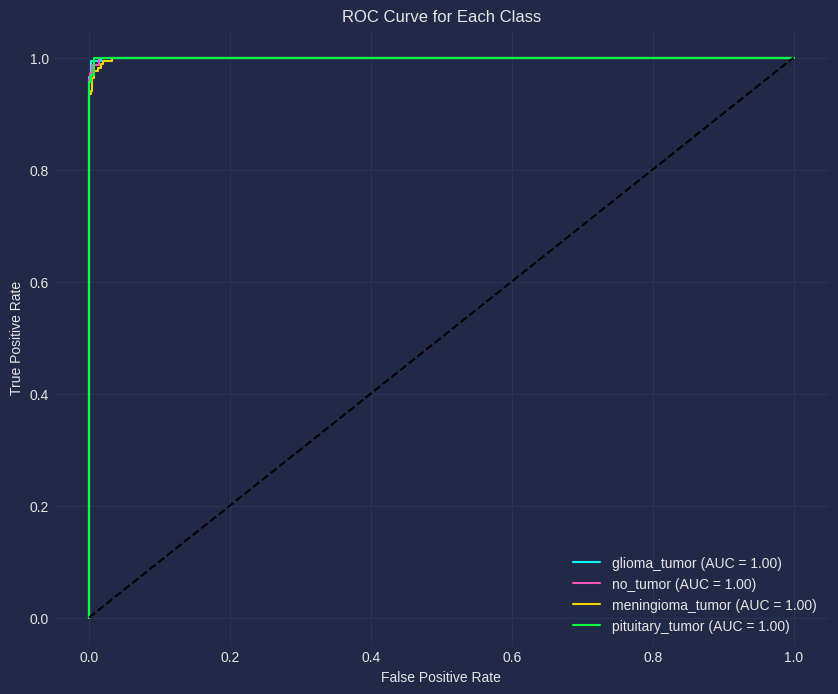

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize labels for ROC analysis
y_test_bin = label_binarize(y_true_test, classes=range(len(LABELS)))
y_pred_bin = model.predict(X_test)

# Plot ROC for each class
plt.figure(figsize=(10, 8))
for i, label in enumerate(LABELS):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred_bin[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{label} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Each Class")
plt.legend()
plt.grid(True)
plt.show()


RESNET


In [ ]:
# Load the ResNet101 model pretrained on ImageNet without the top layers
resnet = tf.keras.applications.ResNet101(
    weights='imagenet',
    include_top=False,
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)
)

# Build the custom model on top of the ResNet101 base
x = resnet.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(rate=0.5)(x)
x = tf.keras.layers.Dense(len(LABELS), activation='softmax')(x)  # Use number of classes dynamically

# Create the complete model
model = tf.keras.models.Model(inputs=resnet.input, outputs=x)

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print the model summary to verify the architecture
model.summary()

171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 150, 150, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 156, 156, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 75, 75, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 75, 75, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 75, 75, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 77, 77, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 38, 38, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 38, 38, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 38, 38, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 38, 38, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 38, 38, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 38, 38, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 38, 38, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 38, 38, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 38, 38, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)             

 Total params: 42,666,372 (162.76 MB)

 Trainable params: 42,561,028 (162.36 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [ ]:
# TensorBoard callback for logging training metrics
tensorboard_callback = TensorBoard(log_dir='logs')

# ModelCheckpoint callback to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath="resnet101.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

# ReduceLROnPlateau callback to reduce learning rate if validation accuracy plateaus
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.1,
    patience=2,
    min_delta=0.0001,
    verbose=1
)

TRAINING THE MODEL

In [ ]:
# Train the model
history = model.fit(
    X_train,
    y_train,
    validation_split=0.1,
    epochs=20,
    batch_size=32,
    verbose=1,
    callbacks=[tensorboard_callback, checkpoint_callback, reduce_lr_callback]
)

Epoch 1/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 992ms/step - accuracy: 0.6327 - loss: 1.1392
Epoch 1: val_accuracy improved from -inf to 0.29130, saving model to resnet101.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 197s 1s/step - accuracy: 0.6340 - loss: 1.1347 - val_accuracy: 0.2913 - val_loss: 1171.6215 - learning_rate: 0.0010
Epoch 2/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.8451 - loss: 0.4267
Epoch 2: val_accuracy did not improve from 0.29130
65/65 ━━━━━━━━━━━━━━━━━━━━ 18s 282ms/step - accuracy: 0.8448 - loss: 0.4277 - val_accuracy: 0.2304 - val_loss: 12.9486 - learning_rate: 0.0010
Epoch 3/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.8597 - loss: 0.3758
Epoch 3: val_accuracy improved from 0.29130 to 0.66522, saving model to resnet101.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 28s 408ms/step - accuracy: 0.8601 - loss: 0.3749 - val_accuracy: 0.6652 - val_loss: 6.9976 - learning_rate: 0.0010
Epoch 4/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9210 - loss: 0.2261
Epoc

In [ ]:
# Define the path to save the ResNet101 model in Google Drive
drive_model_path_resnet = '/content/drive/MyDrive/Major_Project1/resnet101_model.h5'

# Save the ResNet101 model to the specified path
model.save(drive_model_path_resnet)

print(f"ResNet101 model saved at: {drive_model_path_resnet}")


ResNet101 model saved at: /content/drive/MyDrive/Major_Project1/resnet101_model.h5


In [ ]:
from tensorflow.keras.models import load_model

# Path to the saved ResNet101 model
drive_model_path_resnet = '/content/drive/MyDrive/Major_Project1/resnet101_model.h5'

# Load the ResNet101 model
resnet_model = load_model(drive_model_path_resnet)

print("ResNet101 model loaded successfully!")


ResNet101 model loaded successfully!


EVALUATING THE MODEL PERFORMANCE

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a subplot with 1 row and 2 columns for loss and accuracy
fig = make_subplots(rows=1, cols=2, subplot_titles=("Training and Validation Loss", "Training and Validation Accuracy"))

# Plot training and validation loss
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['loss']))), y=history.history['loss'], mode='lines', name='Train Loss'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['val_loss']))), y=history.history['val_loss'], mode='lines', name='Validation Loss'),
    row=1, col=1
)

# Plot training and validation accuracy
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['accuracy']))), y=history.history['accuracy'], mode='lines', name='Train Accuracy'),
    row=1, col=2
)
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['val_accuracy']))), y=history.history['val_accuracy'], mode='lines', name='Validation Accuracy'),
    row=1, col=2
)
# Update layout and axis labels
fig.update_layout(
    title_text="Training and Validation Metrics",
    height=500,
    width=900
)

fig.update_xaxes(title_text="Epoch", row=1, col=1)
fig.update_yaxes(title_text="Loss", row=1, col=1)
fig.update_xaxes(title_text="Epoch", row=1, col=2)
fig.update_yaxes(title_text="Accuracy", row=1, col=2)

# Show the plot
fig.show()

CONFUSION MATRIX

18/18 ━━━━━━━━━━━━━━━━━━━━ 15s 560ms/step


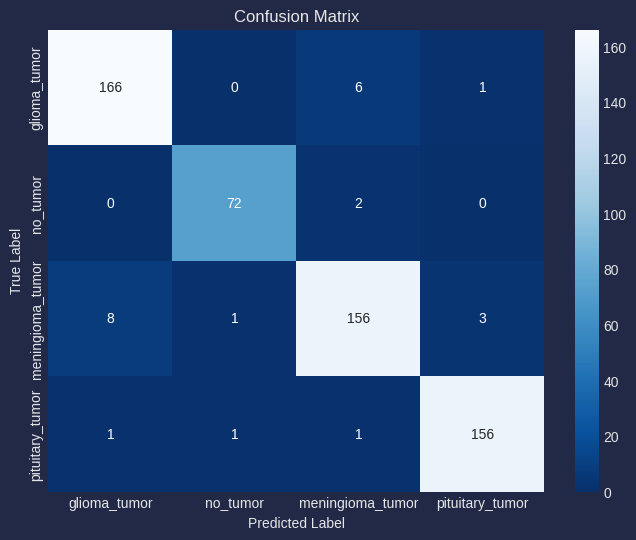

In [ ]:
# Calculate predictions and true labels for test data
y_true_test = np.argmax(y_test, axis=1)
y_pred_test = np.argmax(model.predict(X_test), axis=1)

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(
    confusion_matrix(y_true_test, y_pred_test),
    annot=True,
    fmt='d',
    cmap='Blues_r',
    xticklabels=LABELS,  # Use defined LABELS for axis ticks
    yticklabels=LABELS
)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

CLASSIFICATION REPORT

In [ ]:
# Print classification report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.95      0.96      0.95       173
           1       0.97      0.97      0.97        74
           2       0.95      0.93      0.94       168
           3       0.97      0.98      0.98       159

    accuracy                           0.96       574
   macro avg       0.96      0.96      0.96       574
weighted avg       0.96      0.96      0.96       574



TESTING ON THREE RANDOM OBJECTS

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted label (Image 1): glioma_tumor
Actual label (Image 1): glioma_tumor
Confidence (Image 1): 100.00%

Predicted label (Image 2): pituitary_tumor
Actual label (Image 2): pituitary_tumor
Confidence (Image 2): 100.00%

Predicted label (Image 3): pituitary_tumor
Actual label (Image 3): pituitary_tumor
Confidence (Image 3): 100.00%



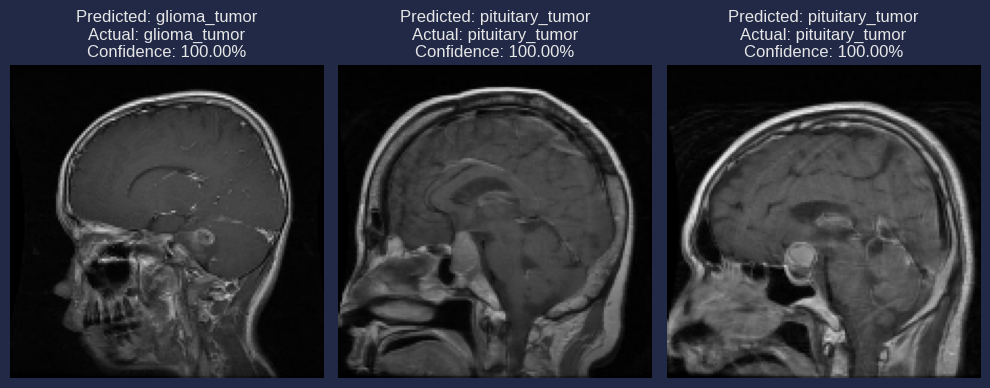

In [ ]:
# Select 3 random indices from the test set
random_indices = np.random.choice(len(X_test), size=3, replace=False)
random_imgs = X_test[random_indices]
predictions = model.predict(random_imgs.reshape(3, IMAGE_SIZE, IMAGE_SIZE, 3))  # Reshape for model input

# Prepare lists for predicted and actual labels and confidences
predicted_labels = []
actual_labels = []
confidences = []

# Interpret the model's predictions for each random image
for i in range(3):
    predicted_class = np.argmax(predictions[i])  # Index of the class with the highest probability
    predicted_labels.append(LABELS[predicted_class])  # Convert index to label
    confidences.append(predictions[i][predicted_class])  # Confidence score

    actual_index = y_test[random_indices[i]]  # One-hot encoded actual class
    actual_class = np.argmax(actual_index)
    actual_labels.append(LABELS[actual_class])  # Convert index to label

# Display the image and prediction information
for i in range(3):
    print(f"\033[94mPredicted label (Image {i+1}): {predicted_labels[i]}\033[0m")
    print(f"\033[92mActual label (Image {i+1}): {actual_labels[i]}\033[0m")
    print(f"\033[93mConfidence (Image {i+1}): {confidences[i] * 100:.2f}%\033[0m\n")

# Display the selected images side by side
plt.figure(figsize=(10, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(random_imgs[i])
    plt.axis('off')  # Hide axis
    plt.title(f"Predicted: {predicted_labels[i]}\nActual: {actual_labels[i]}\nConfidence: {confidences[i] * 100:.2f}%")
plt.tight_layout()
plt.show()

XCEPTION

In [ ]:
# Load the Xception model pretrained on ImageNet without the top layers
xception = tf.keras.applications.Xception(
    weights='imagenet',
    include_top=False,
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)
)

# Build the custom model on top of the Xception base
x = xception.output  # Use a different variable name to avoid confusion
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(1536, activation='relu')(x)
x = tf.keras.layers.Dropout(rate=0.5)(x)
x = tf.keras.layers.Dense(len(LABELS), activation='softmax')(x)  # Use number of classes dynamically

# Create the complete model
model = tf.keras.models.Model(inputs=xception.input, outputs=x)

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print the model summary to verify the architecture
model.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 150, 150, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 74, 74, 32)     │            864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 74, 74, 32)     │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 74, 74, 32)     │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 72, 72, 64)     │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 72, 72, 64)     │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 72, 72, 64)     │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 72, 72, 128)    │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 72, 72, 128)    │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 72, 72, 128)    │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 72, 72, 128)    │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 72, 72, 128)    │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 36, 36, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 36, 36, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 24,014,892 (91.61 MB)

 Trainable params: 23,960,364 (91.40 MB)

 Non-trainable params: 54,528 (213.00 KB)

In [ ]:
# TensorBoard callback for logging training metrics
tensorboard_callback = TensorBoard(log_dir='logs')

# ModelCheckpoint callback to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath="xception.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

# ReduceLROnPlateau callback to reduce learning rate if validation accuracy plateaus
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.1,
    patience=2,
    min_delta=0.0001,
    verbose=1
)

TRAINING THE MODEL

In [ ]:
# Train the model
history = model.fit(
    X_train,
    y_train,
    validation_split=0.1,
    epochs=20,
    batch_size=32,
    verbose=1,
    callbacks=[tensorboard_callback, checkpoint_callback, reduce_lr_callback]
)

Epoch 1/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 571ms/step - accuracy: 0.6787 - loss: 0.8622
Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to xception.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 101s 747ms/step - accuracy: 0.6801 - loss: 0.8590 - val_accuracy: 0.5000 - val_loss: 15.8511 - learning_rate: 0.0010
Epoch 2/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.8844 - loss: 0.3520
Epoch 2: val_accuracy improved from 0.50000 to 0.68261, saving model to xception.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 19s 294ms/step - accuracy: 0.8846 - loss: 0.3517 - val_accuracy: 0.6826 - val_loss: 12.1644 - learning_rate: 0.0010
Epoch 3/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.9164 - loss: 0.2411
Epoch 3: val_accuracy improved from 0.68261 to 0.77826, saving model to xception.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 19s 287ms/step - accuracy: 0.9166 - loss: 0.2406 - val_accuracy: 0.7783 - val_loss: 0.8376 - learning_rate: 0.0010
Epoch 4/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - a

In [ ]:
# Define the path to save the Xception model in Google Drive
drive_model_path_xception = '/content/drive/MyDrive/Major_Project1/xception_model.h5'

# Save the Xception model to the specified path
model.save(drive_model_path_xception)

print(f"Xception model saved at: {drive_model_path_xception}")


Xception model saved at: /content/drive/MyDrive/Major_Project1/xception_model.h5


In [ ]:
from tensorflow.keras.models import load_model

# Path to the saved Xception model
drive_model_path_xception = '/content/drive/MyDrive/Major_Project1/xception_model.h5'

# Load the Xception model
xception_model = load_model(drive_model_path_xception)

print("Xception model loaded successfully!")


Xception model loaded successfully!


Evaluating the Model Performance

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, subplot_titles=("Training and Validation Loss", "Training and Validation Accuracy"))

# Plot training and validation loss
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['loss']))), y=history.history['loss'], mode='lines', name='Train Loss'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['val_loss']))), y=history.history['val_loss'], mode='lines', name='Validation Loss'),
    row=1, col=1
)
# Plot training and validation accuracy
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['accuracy']))), y=history.history['accuracy'], mode='lines', name='Train Accuracy'),
    row=1, col=2
)
fig.add_trace(
    go.Scatter(x=list(range(len(history.history['val_accuracy']))), y=history.history['val_accuracy'], mode='lines', name='Validation Accuracy'),
    row=1, col=2
)

# Update layout and axis labels
fig.update_layout(
    title_text="Training and Validation Metrics",
    height=500,
    width=900
)
fig.update_xaxes(title_text="Epoch", row=1, col=1)
fig.update_yaxes(title_text="Loss", row=1, col=1)
fig.update_xaxes(title_text="Epoch", row=1, col=2)
fig.update_yaxes(title_text="Accuracy", row=1, col=2)

# Show the plot
fig.show()

CONFUSION MATRIX

18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 443ms/step


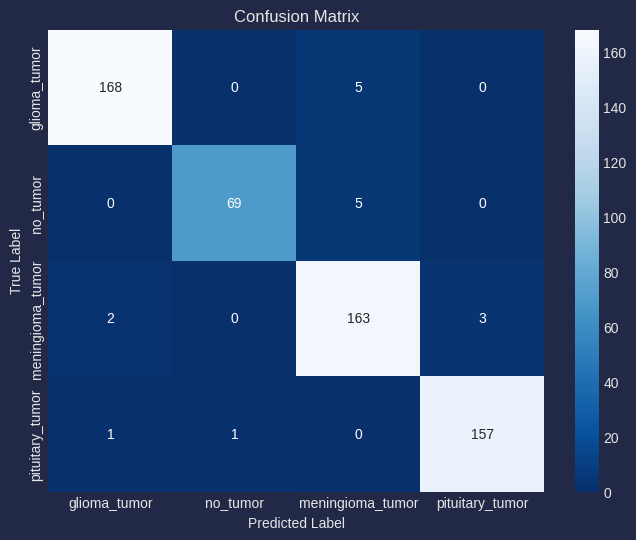

In [ ]:
# Calculate predictions and true labels for test data
y_true_test = np.argmax(y_test, axis=1)
y_pred_test = np.argmax(model.predict(X_test), axis=1)

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(
    confusion_matrix(y_true_test, y_pred_test),
    annot=True,
    fmt='d',
    cmap='Blues_r',
    xticklabels=LABELS,  # Use defined LABELS for axis ticks
    yticklabels=LABELS
)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

CLASSIFICATION REPORT

In [ ]:
# Print classification report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98       173
           1       0.99      0.93      0.96        74
           2       0.94      0.97      0.96       168
           3       0.98      0.99      0.98       159

    accuracy                           0.97       574
   macro avg       0.97      0.97      0.97       574
weighted avg       0.97      0.97      0.97       574



TESTING ON 3 RANDOM IMAGES

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted label (Image 1): pituitary_tumor
Actual label (Image 1): pituitary_tumor
Confidence (Image 1): 100.00%

Predicted label (Image 2): meningioma_tumor
Actual label (Image 2): meningioma_tumor
Confidence (Image 2): 100.00%

Predicted label (Image 3): meningioma_tumor
Actual label (Image 3): meningioma_tumor
Confidence (Image 3): 99.60%



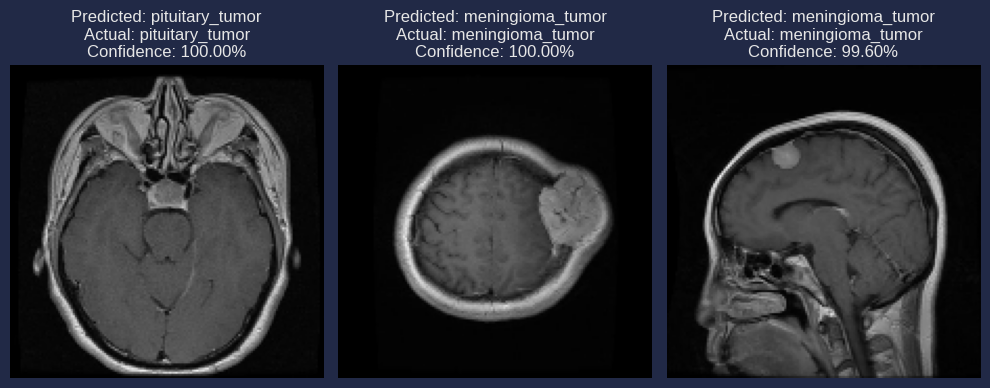

In [ ]:
# Select 3 random indices from the test set
random_indices = np.random.choice(len(X_test), size=3, replace=False)
random_imgs = X_test[random_indices]
predictions = model.predict(random_imgs.reshape(3, IMAGE_SIZE, IMAGE_SIZE, 3))  # Reshape for model input

# Prepare lists for predicted and actual labels and confidences
predicted_labels = []
actual_labels = []
confidences = []

# Interpret the model's predictions for each random image
for i in range(3):
    predicted_class = np.argmax(predictions[i])  # Index of the class with the highest probability
    predicted_labels.append(LABELS[predicted_class])  # Convert index to label
    confidences.append(predictions[i][predicted_class])  # Confidence score

    actual_index = y_test[random_indices[i]]  # One-hot encoded actual class
    actual_class = np.argmax(actual_index)
    actual_labels.append(LABELS[actual_class])  # Convert index to label

# Display the image and prediction information
for i in range(3):
    print(f"\033[94mPredicted label (Image {i+1}): {predicted_labels[i]}\033[0m")
    print(f"\033[92mActual label (Image {i+1}): {actual_labels[i]}\033[0m")
    print(f"\033[93mConfidence (Image {i+1}): {confidences[i] * 100:.2f}%\033[0m\n")

# Display the selected images side by side
plt.figure(figsize=(10, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(random_imgs[i])
    plt.axis('off')  # Hide axis
    plt.title(f"Predicted: {predicted_labels[i]}\nActual: {actual_labels[i]}\nConfidence: {confidences[i] * 100:.2f}%")
plt.tight_layout()
plt.show()


DENSENET

In [ ]:
densenet121 = tf.keras.applications.DenseNet121(
    weights='imagenet',
    include_top=False,
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)  # Use your desired input shape
)

# Build the custom model on top of DenseNet121 base
x = densenet121.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(rate=0.5)(x)
x = tf.keras.layers.Dense(len(LABELS), activation='softmax')(x)  # Number of classes dynamically

# Create the complete model
model = tf.keras.models.Model(inputs=densenet121.input, outputs=x)
# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary to verify the architecture
model.summary()

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 150, 150, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 156, 156, 3)    │              0 │ input_layer_3[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 75, 75, 64)     │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 75, 75, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 75, 75, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 77, 77, 64)     │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 38, 38, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 38, 38, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 38, 38, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 38, 38, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 38, 38, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 38, 38, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 38, 38, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 38, 38, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 7,041,604 (26.86 MB)

 Trainable params: 6,957,956 (26.54 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [ ]:
# TensorBoard callback for logging training metrics
tensorboard_callback = TensorBoard(log_dir='logs')

# ModelCheckpoint callback to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath="densenet121.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

# ReduceLROnPlateau callback to reduce learning rate if validation accuracy plateaus
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.1,
    patience=2,
    min_delta=0.0001,
    verbose=1
)

TRAINING THE MODEL

In [ ]:
# Train the model
history = model.fit(
    X_train,
    y_train,
    validation_split=0.1,
    epochs=20,
    batch_size=32,
    verbose=1,
    callbacks=[tensorboard_callback, checkpoint_callback, reduce_lr_callback]
)

Epoch 1/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6809 - loss: 1.0279   
Epoch 1: val_accuracy improved from -inf to 0.37391, saving model to densenet121.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 281s 2s/step - accuracy: 0.6821 - loss: 1.0236 - val_accuracy: 0.3739 - val_loss: 17.8684 - learning_rate: 0.0010
Epoch 2/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.8681 - loss: 0.3855
Epoch 2: val_accuracy improved from 0.37391 to 0.42174, saving model to densenet121.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 51s 185ms/step - accuracy: 0.8684 - loss: 0.3846 - val_accuracy: 0.4217 - val_loss: 10.0959 - learning_rate: 0.0010
Epoch 3/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.9428 - loss: 0.1747
Epoch 3: val_accuracy improved from 0.42174 to 0.44348, saving model to densenet121.keras
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 183ms/step - accuracy: 0.9427 - loss: 0.1749 - val_accuracy: 0.4435 - val_loss: 2.7556 - learning_rate: 0.0010
Epoch 4/20
65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/st

In [ ]:
# Define the path to save the DenseNet model in Google Drive
drive_model_path_densenet = '/content/drive/MyDrive/Major_Project1/densenet_model.h5'

# Save the DenseNet model to the specified path
model.save(drive_model_path_densenet)

print(f"DenseNet model saved at: {drive_model_path_densenet}")


DenseNet model saved at: /content/drive/MyDrive/Major_Project1/densenet_model.h5


In [ ]:
from tensorflow.keras.models import load_model

# Path to the saved DenseNet model
drive_model_path_densenet = '/content/drive/MyDrive/Major_Project1/densenet_model.h5'

# Load the DenseNet model
densenet_model = load_model(drive_model_path_densenet)

print("DenseNet model loaded successfully!")


DenseNet model loaded successfully!


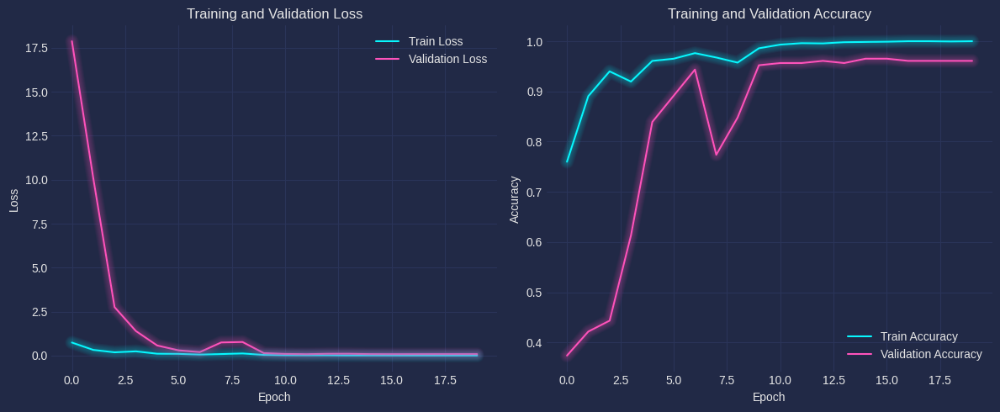

In [ ]:
# Plotting training and validation loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
mplcyberpunk.make_lines_glow()

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
mplcyberpunk.make_lines_glow()

plt.tight_layout()
plt.show()

18/18 ━━━━━━━━━━━━━━━━━━━━ 21s 779ms/step


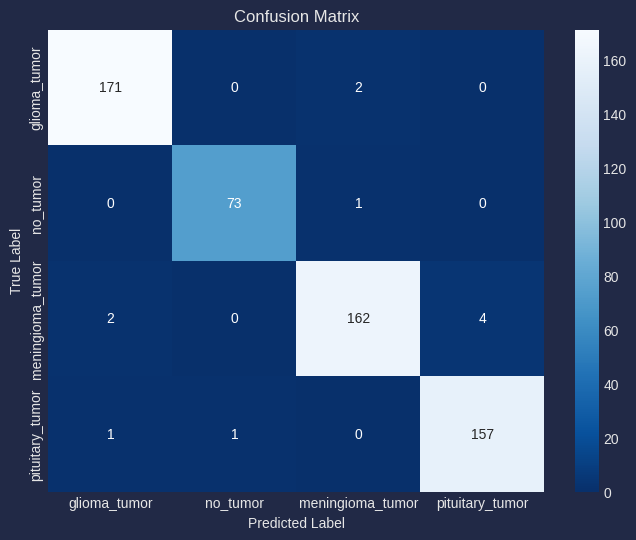

In [ ]:
# Calculate predictions and true labels for test data
y_true_test = np.argmax(y_test, axis=1)
y_pred_test = np.argmax(model.predict(X_test), axis=1)

# Plotting the confusion matrix
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(
    confusion_matrix(y_true_test, y_pred_test),
    annot=True,
    fmt='d',
    cmap='Blues_r',
    xticklabels=LABELS,  # Use defined LABELS for axis ticks
    yticklabels=LABELS
)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
# Print classification report
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       173
           1       0.99      0.99      0.99        74
           2       0.98      0.96      0.97       168
           3       0.98      0.99      0.98       159

    accuracy                           0.98       574
   macro avg       0.98      0.98      0.98       574
weighted avg       0.98      0.98      0.98       574



1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Predicted label (Image 1): pituitary_tumor
Actual label (Image 1): pituitary_tumor
Confidence (Image 1): 99.80%

Predicted label (Image 2): pituitary_tumor
Actual label (Image 2): pituitary_tumor
Confidence (Image 2): 99.96%

Predicted label (Image 3): pituitary_tumor
Actual label (Image 3): pituitary_tumor
Confidence (Image 3): 100.00%



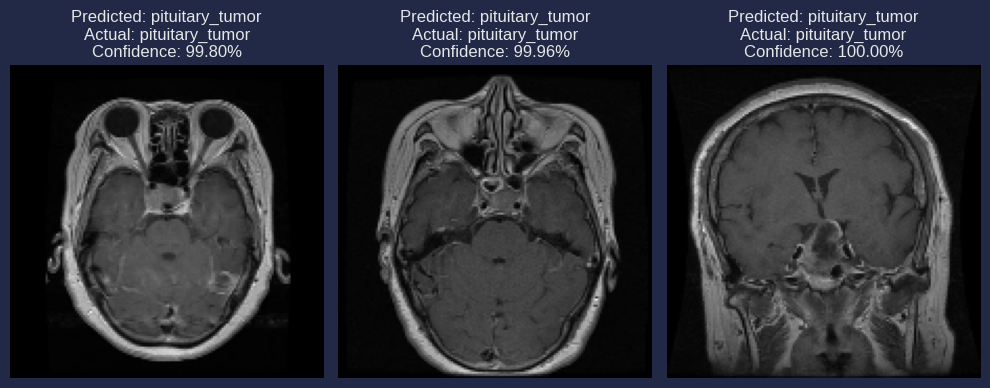

In [ ]:
# Select 3 random indices from the test set
random_indices = np.random.choice(len(X_test), size=3, replace=False)
random_imgs = X_test[random_indices]
predictions = model.predict(random_imgs.reshape(3, IMAGE_SIZE, IMAGE_SIZE, 3))  # Reshape for model input

# Prepare lists for predicted and actual labels and confidences
predicted_labels = []
actual_labels = []
confidences = []

# Interpret the model's predictions for each random image
for i in range(3):
    predicted_class = np.argmax(predictions[i])  # Index of the class with the highest probability
    predicted_labels.append(LABELS[predicted_class])  # Convert index to label
    confidences.append(predictions[i][predicted_class])  # Confidence score

    actual_index = y_test[random_indices[i]]  # One-hot encoded actual class
    actual_class = np.argmax(actual_index)
    actual_labels.append(LABELS[actual_class])  # Convert index to label

# Display the image and prediction information
for i in range(3):
    print(f"\033[94mPredicted label (Image {i+1}): {predicted_labels[i]}\033[0m")
    print(f"\033[92mActual label (Image {i+1}): {actual_labels[i]}\033[0m")
    print(f"\033[93mConfidence (Image {i+1}): {confidences[i] * 100:.2f}%\033[0m\n")

# Display the selected images side by side
plt.figure(figsize=(10, 4))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.imshow(random_imgs[i])
    plt.axis('off')  # Hide axis
    plt.title(f"Predicted: {predicted_labels[i]}\nActual: {actual_labels[i]}\nConfidence: {confidences[i] * 100:.2f}%")
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import img_to_array

def grad_cam(model, image, layer_name):
    """
    Generates a Grad-CAM heatmap for a specific layer in the model.

    Parameters:
        model: Trained model
        image: Preprocessed image for prediction
        layer_name: Name of the convolutional layer to visualize

    Returns:
        heatmap: Grad-CAM heatmap
    """
    # Create a model to fetch outputs of the target layer and the final prediction
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    # Record gradients during forward pass
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image)
        predicted_class = tf.argmax(predictions[0])  # Get the predicted class
        loss = predictions[:, predicted_class]

    # Compute gradients of the predicted class w.r.t. convolutional outputs
    grads = tape.gradient(loss, conv_outputs)

    # Compute the channel-wise mean of gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel by its importance and sum up
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()


In [ ]:
import cv2

def overlay_heatmap(heatmap, image, alpha=0.6, colormap=cv2.COLORMAP_JET):
    """
    Overlays the Grad-CAM heatmap on the original image.

    Parameters:
        heatmap: Grad-CAM heatmap
        image: Original image (not preprocessed)
        alpha: Opacity of the heatmap overlay
        colormap: Colormap to use for heatmap visualization

    Returns:
        overlayed_image: Image with heatmap overlay
    """
    # Resize heatmap to match the image size
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    # Apply colormap
    heatmap_colored = cv2.applyColorMap(heatmap, colormap)

    # Combine heatmap with the original image
    overlayed_image = cv2.addWeighted(image, 1 - alpha, heatmap_colored, alpha, 0)
    return overlayed_image


In [ ]:
for layer in model.layers:
    print(layer.name)


input_layer_3
zero_padding2d
conv1_conv
conv1_bn
conv1_relu
zero_padding2d_1
pool1
conv2_block1_0_bn
conv2_block1_0_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_concat
conv2_block2_0_bn
conv2_block2_0_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_concat
conv2_block3_0_bn
conv2_block3_0_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_concat
conv2_block4_0_bn
conv2_block4_0_relu
conv2_block4_1_conv
conv2_block4_1_bn
conv2_block4_1_relu
conv2_block4_2_conv
conv2_block4_concat
conv2_block5_0_bn
conv2_block5_0_relu
conv2_block5_1_conv
conv2_block5_1_bn
conv2_block5_1_relu
conv2_block5_2_conv
conv2_block5_concat
conv2_block6_0_bn
conv2_block6_0_relu
conv2_block6_1_conv
conv2_block6_1_bn
conv2_block6_1_relu
conv2_block6_2_conv
conv2_block6_concat
pool2_bn
pool2_relu
pool2_conv
pool2_pool
conv3_block1_0_bn
conv3_block1_0_relu
conv3_block1_1_conv
c

In [ ]:
last_conv_layer_name = "conv5_block16_concat"  # Replace with the actual layer name


In [ ]:
def grad_cam(model, img_array, last_conv_layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        predicted_class = tf.argmax(predictions[0])
        loss = predictions[:, predicted_class]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    return heatmap.numpy()


In [ ]:
heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)


18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
Number of misclassified images: 11


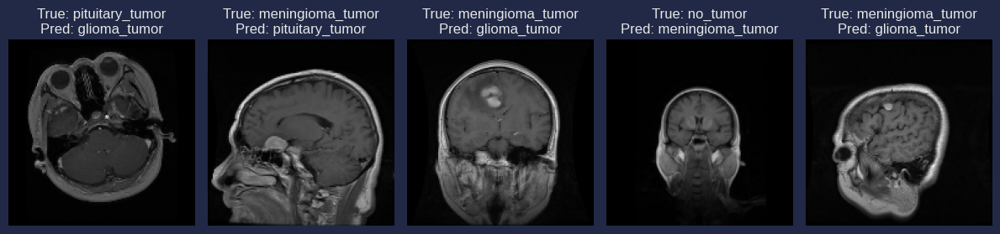

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict labels for the test set
y_pred = np.argmax(model.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)

# Identify misclassified indices
misclassified_indices = np.where(y_pred != y_true)[0]

print(f"Number of misclassified images: {len(misclassified_indices)}")

# Plot misclassified images
plt.figure(figsize=(12, 6))
for i, idx in enumerate(misclassified_indices[:5]):  # Show first 5 misclassifications
    plt.subplot(1, 5, i + 1)
    plt.imshow(X_test[idx])
    plt.axis('off')
    plt.title(f"True: {LABELS[y_true[idx]]}\nPred: {LABELS[y_pred[idx]]}")
plt.tight_layout()
plt.show()


In [ ]:
# Set the correct path for the ResNet101 model
model_path = "/content/drive/MyDrive/Major_Project1/resnet101.keras"

# Load your pre-trained model
model = tf.keras.models.load_model(model_path)


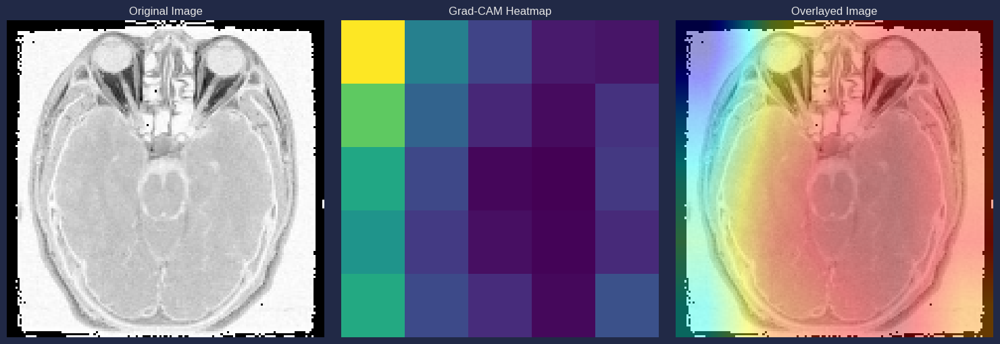

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess image
def preprocess_image(img_path, img_size=(150, 150)):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    """
    Generate a Grad-CAM heatmap for a given image and model.
    """
    # Create a model that outputs the activations of the last conv layer and predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    # Compute the mean intensity of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / (np.max(heatmap) + 1e-8)  # Add small value to avoid divide-by-zero
    return heatmap  # Return heatmap as NumPy array

# Helper function to overlay heatmap on original image
def overlay_heatmap(heatmap, img, alpha=0.4):
    """
    Overlay heatmap on the original image.
    """
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert heatmap to a colormap (you can choose other color maps like 'jet', 'viridis', etc.)
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply colormap

    # Superimpose the heatmap on the image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model (replace this with the path to your saved model)
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model(model_path)

# Choose a random image from the test set
random_idx = np.random.choice(len(X_test), 1)[0]
test_image = X_test[random_idx]
original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

# Preprocess the image for model input
preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
preprocessed_image = preprocessed_image / 255.0  # Normalize the image

# Select the name of the last convolutional layer (you may need to inspect the model to get the exact layer name)
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Generate Grad-CAM heatmap
heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

# Overlay the heatmap on the original image
overlayed_image = overlay_heatmap(heatmap, original_image)

# Display the original image, heatmap, and overlayed image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap="viridis")
plt.title("Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title("Overlayed Image")
plt.axis("off")

plt.tight_layout()
plt.show()


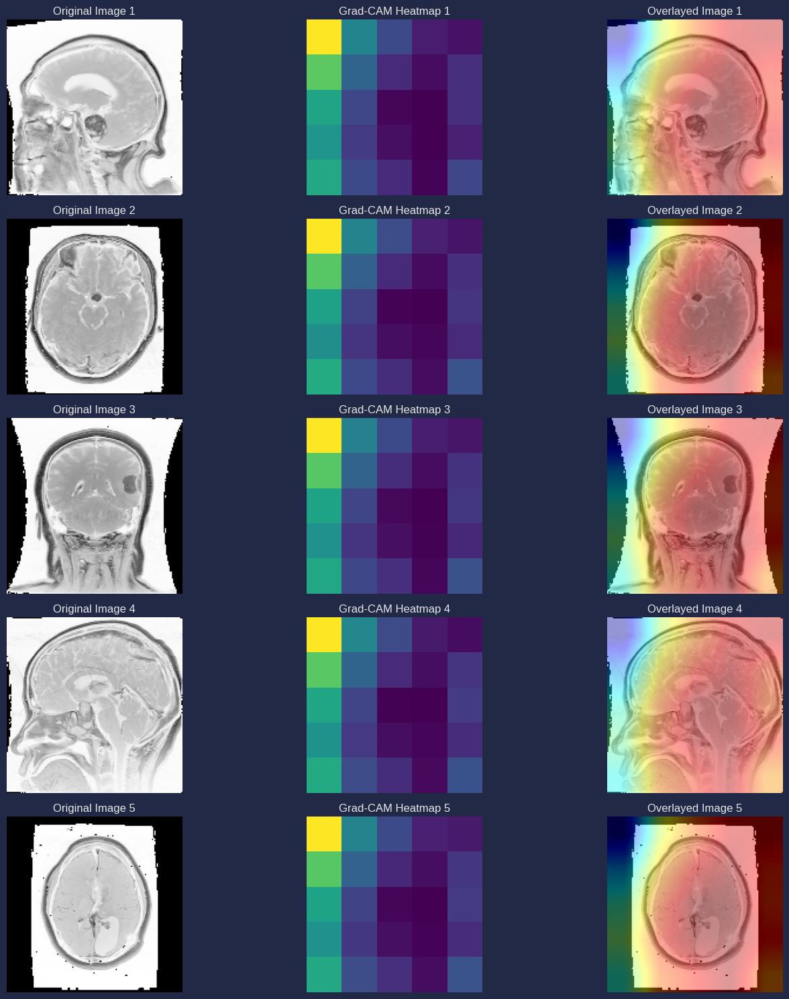

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    """
    Generate a Grad-CAM heatmap for a given image and model.
    """
    # Create a model that outputs the activations of the last conv layer and predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    # Compute the mean intensity of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / (np.max(heatmap) + 1e-8)  # Add small value to avoid divide-by-zero
    return heatmap  # Return heatmap as NumPy array

# Helper function to overlay heatmap on original image
def overlay_heatmap(heatmap, img, alpha=0.4):
    """
    Overlay heatmap on the original image.
    """
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert heatmap to a colormap (you can choose other color maps like 'jet', 'viridis', etc.)
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply colormap

    # Superimpose the heatmap on the image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model (replace this with the path to your saved model)
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name (you may need to inspect the model to get the exact layer name)
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Number of images to process (e.g., the first 5 images from the test set)
num_images = 5

# Prepare the plot for visualizing multiple images with Grad-CAM
plt.figure(figsize=(15, 3 * num_images))

for i in range(num_images):
    # Select an image from the test set
    test_image = X_test[i]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Overlay the heatmap on the original image
    overlayed_image = overlay_heatmap(heatmap, original_image)

    # Display the original image, heatmap, and overlayed image
    plt.subplot(num_images, 3, 3 * i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3 * i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3 * i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Overlayed Image {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


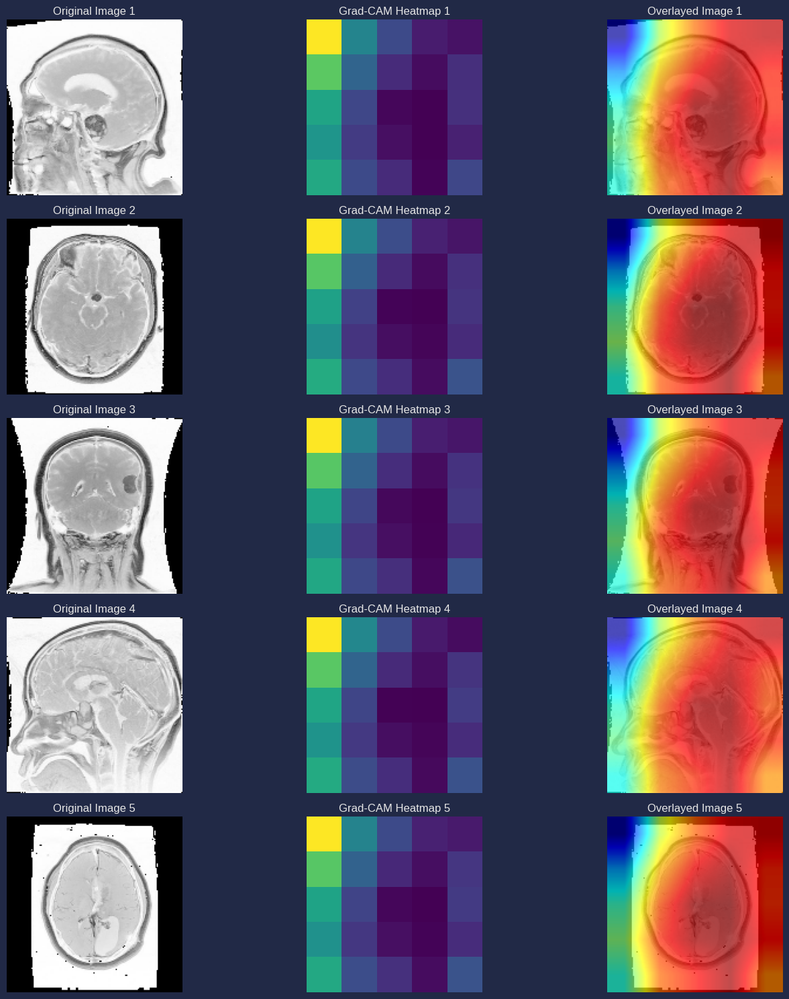

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    """
    Generate a Grad-CAM heatmap for a given image and model.
    """
    # Create a model that outputs the activations of the last conv layer and predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    # Compute the mean intensity of the gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / (np.max(heatmap) + 1e-8)  # Add small value to avoid divide-by-zero
    return heatmap  # Return heatmap as NumPy array

# Helper function to overlay heatmap on original image
def overlay_heatmap(heatmap, img, alpha=0.6, colormap=cv2.COLORMAP_JET, threshold=0.2):
    """
    Overlay heatmap on the original image with adjusted intensity.
    """
    # Resize the heatmap to match the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert heatmap to a colormap (you can choose other color maps like 'jet', 'viridis', etc.)
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    heatmap = cv2.applyColorMap(heatmap, colormap)  # Apply colormap

    # Threshold heatmap to highlight only the most important areas (e.g., tumor regions)
    heatmap = np.where(heatmap > threshold, heatmap, 0)  # Keep areas with intensity above threshold

    # Superimpose the heatmap on the image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model (replace this with the path to your saved model)
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name (you may need to inspect the model to get the exact layer name)
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Number of images to process (e.g., the first 5 images from the test set)
num_images = 5

# Prepare the plot for visualizing multiple images with Grad-CAM
plt.figure(figsize=(15, 3 * num_images))

for i in range(num_images):
    # Select an image from the test set
    test_image = X_test[i]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Overlay the heatmap on the original image with stronger visibility for tumor regions
    overlayed_image = overlay_heatmap(heatmap, original_image, alpha=0.7, colormap=cv2.COLORMAP_JET, threshold=0.3)

    # Display the original image, heatmap, and overlayed image
    plt.subplot(num_images, 3, 3 * i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3 * i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3 * i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Overlayed Image {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


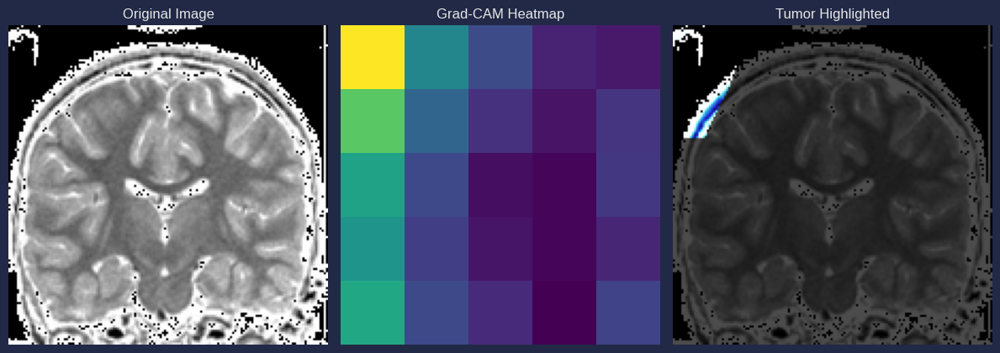

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model (replace this with the path to your saved model)
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name (you may need to inspect the model to get the exact layer name)
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Select a random image from your test set
random_idx = np.random.choice(len(X_test), 1)[0]
test_image = X_test[random_idx]
original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

# Preprocess the image for model input
preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
preprocessed_image = preprocessed_image / 255.0  # Normalize the image

# Generate Grad-CAM heatmap
heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

# Isolate and color only the tumor region based on heatmap
overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

# Plot original, heatmap, and tumor-highlighted image
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap="viridis")
plt.title("Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title("Tumor Highlighted")
plt.axis("off")

plt.tight_layout()
plt.show()


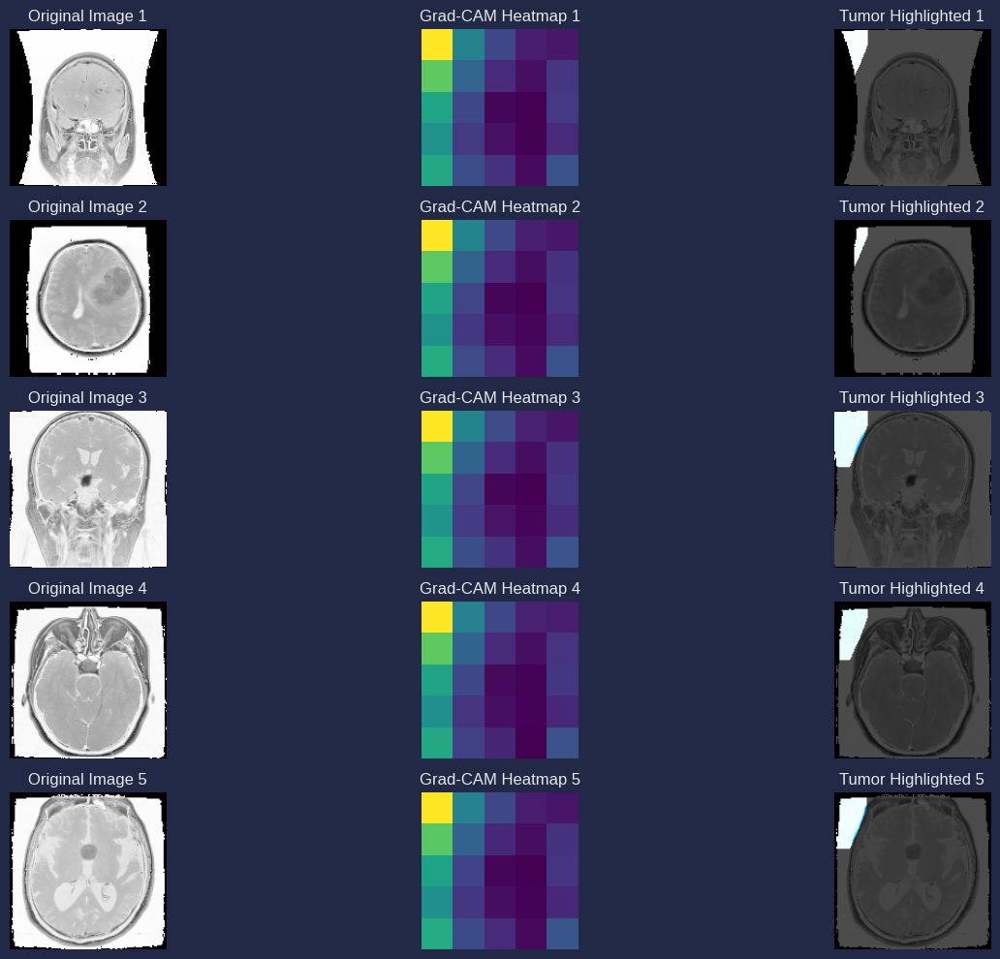

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model (replace this with the path to your saved model)
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name (you may need to inspect the model to get the exact layer name)
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


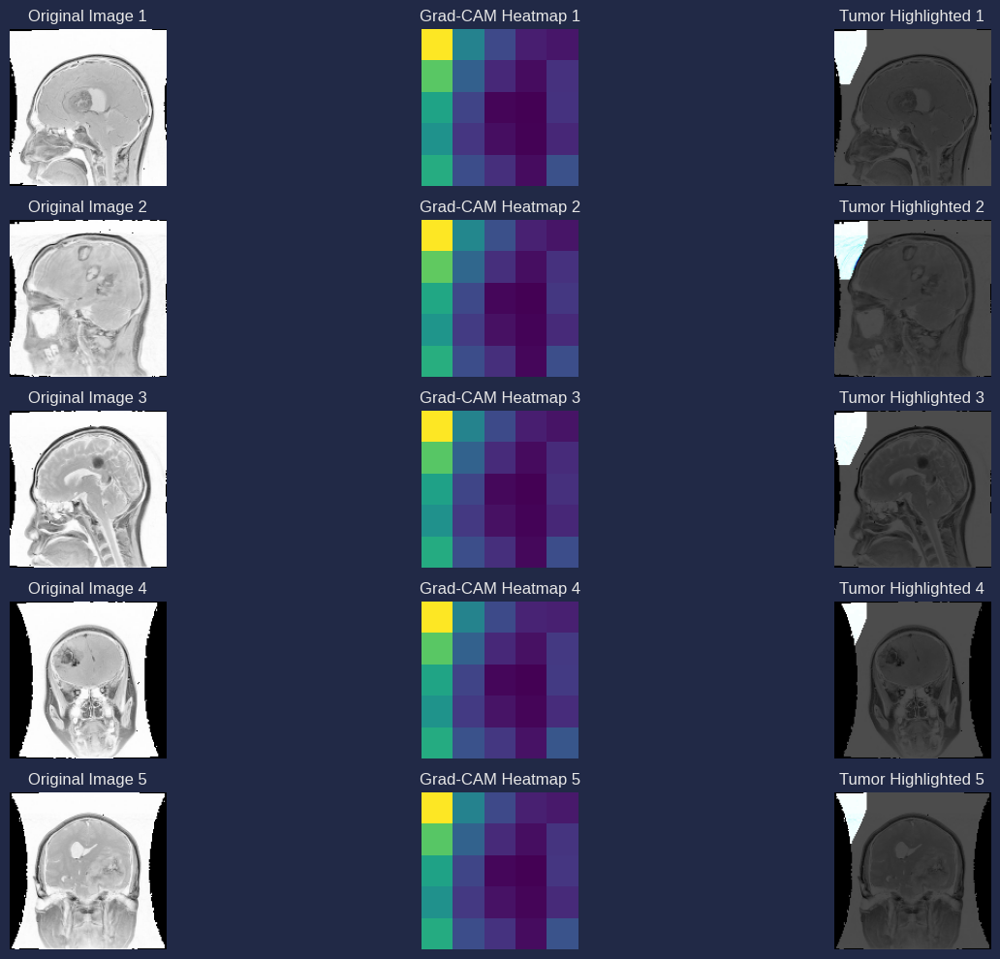

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')

# Specify the last convolutional layer name (for EfficientNetB0, usually 'top_conv')
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


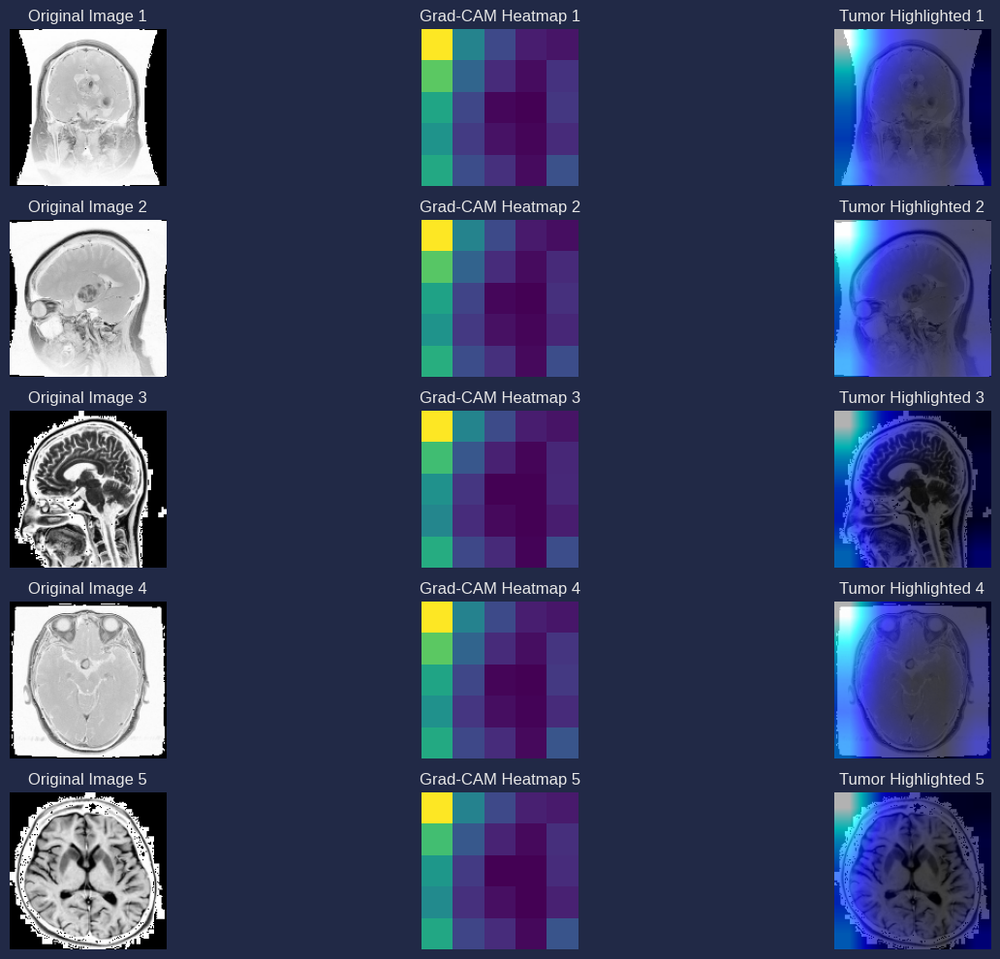

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to overlay heatmap on the image and highlight tumor region
def apply_gradcam_overlay(heatmap, img, alpha=0.7):
    """
    Applies a colored Grad-CAM heatmap to an image to highlight tumor regions.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a colormap for visualization (HOT colormap for enhanced tumor visibility)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_HOT)

    # Overlay the heatmap on the original image
    overlayed_img = cv2.addWeighted(heatmap_colored, alpha, img, 1 - alpha, 0)

    return overlayed_img

# Load your pre-trained EfficientNetB0 model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')

# Specify the last convolutional layer name (for EfficientNetB0, usually 'top_conv')
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Apply the Grad-CAM overlay to highlight tumor regions
    overlayed_image = apply_gradcam_overlay(heatmap, original_image, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


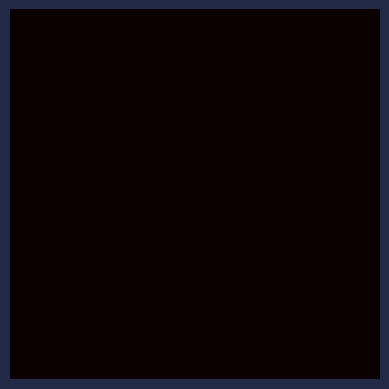

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Load the pre-trained model
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')  # Update with the correct path to your saved model

# Path to the image
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'

# Load and preprocess the image
input_image = image.load_img(image_path, target_size=(150, 150))  # Resize image to fit model input (150x150 for EfficientNetB0)
input_array = image.img_to_array(input_image)
input_array = np.expand_dims(input_array, axis=0)  # Add batch dimension
input_array = input_array / 255.0  # Normalize the image to [0, 1] range

# Convert the NumPy array to a TensorFlow tensor
input_tensor = tf.convert_to_tensor(input_array)

# Specify the class index for the class you want to focus on (e.g., the predicted class)
predictions = model.predict(input_tensor)
pred_index = np.argmax(predictions)  # Get the predicted class index

# Perform gradient computation using tf.GradientTape
with tf.GradientTape() as tape:
    tape.watch(input_tensor)  # Watch the tensor image
    predictions = model(input_tensor)  # Forward pass
    loss = predictions[:, pred_index]  # Get the score for the predicted class

# Compute the gradients of the loss with respect to the input image
grads = tape.gradient(loss, input_tensor)

# Generate the saliency map by taking the absolute max gradient across color channels
saliency_map = tf.reduce_max(tf.abs(grads), axis=-1)

# Convert the saliency map to a numpy array for visualization
saliency_map = np.uint8(255 * saliency_map[0])  # Convert to [0, 255] for visualization

# Plot the saliency map
plt.imshow(saliency_map, cmap='hot')
plt.axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


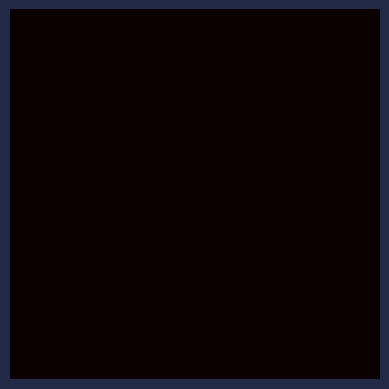

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Load the pre-trained model
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')  # Update with the correct path to your saved model

# Recompile the model (if needed, you can specify optimizer and loss)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Path to the image
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'

# Load and preprocess the image
input_image = image.load_img(image_path, target_size=(150, 150))  # Resize image to fit model input (150x150 for EfficientNetB0)
input_array = image.img_to_array(input_image)
input_array = np.expand_dims(input_array, axis=0)  # Add batch dimension
input_array = input_array / 255.0  # Normalize the image to [0, 1] range

# Convert the NumPy array to a TensorFlow tensor
input_tensor = tf.convert_to_tensor(input_array)

# Specify the class index for the class you want to focus on (e.g., the predicted class)
predictions = model.predict(input_tensor)
pred_index = np.argmax(predictions)  # Get the predicted class index

# Perform gradient computation using tf.GradientTape
with tf.GradientTape() as tape:
    tape.watch(input_tensor)  # Watch the tensor image
    predictions = model(input_tensor)  # Forward pass
    loss = predictions[:, pred_index]  # Get the score for the predicted class

# Compute the gradients of the loss with respect to the input image
grads = tape.gradient(loss, input_tensor)

# Generate the saliency map by taking the absolute max gradient across color channels
saliency_map = tf.reduce_max(tf.abs(grads), axis=-1)

# Convert the saliency map to a numpy array for visualization
saliency_map = np.uint8(255 * saliency_map[0])  # Convert to [0, 255] for visualization

# Plot the saliency map
plt.imshow(saliency_map, cmap='hot')
plt.axis('off')
plt.show()


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Load the pre-trained (and trained) model
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')  # Update with your path

# Path to the image you want to use for Grad-CAM
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image(43).jpg'

# Load and preprocess the image
input_image = image.load_img(image_path, target_size=(150, 150))  # Resize image to fit model input
input_array = image.img_to_array(input_image)
input_array = np.expand_dims(input_array, axis=0)  # Add batch dimension
input_array = input_array / 255.0  # Normalize the image

# Convert the image to a tensor
input_tensor = tf.convert_to_tensor(input_array)

# Predict the class index for the given image
predictions = model.predict(input_tensor)
pred_index = np.argmax(predictions)  # Get the predicted class index

# Perform gradient computation using tf.GradientTape
with tf.GradientTape() as tape:
    tape.watch(input_tensor)  # Watch the tensor image
    predictions = model(input_tensor)  # Forward pass
    loss = predictions[:, pred_index]  # Get the score for the predicted class

# Compute the gradients of the loss with respect to the input image
grads = tape.gradient(loss, input_tensor)

# Generate the Grad-CAM heatmap by reducing along the channels axis
heatmap = tf.reduce_max(tf.abs(grads), axis=-1)

# Normalize and resize heatmap to match the original image size
heatmap = np.uint8(255 * heatmap[0])  # Convert to [0, 255] for visualization
heatmap = np.expand_dims(heatmap, axis=-1)  # Add channel dimension
heatmap = tf.image.resize(heatmap, (input_image.size[1], input_image.size[0]))  # Resize to match input image

# Apply the heatmap to the original image
original_image_resized = np.uint8(255 * input_array[0])  # Rescale input image to [0, 255] for overlay
original_image_resized = cv2.cvtColor(original_image_resized, cv2.COLOR_RGB2BGR)  # Convert to BGR for OpenCV

# Resize heatmap to match the original image dimensions and convert to 3 channels
heatmap_resized = cv2.resize(heatmap.numpy(), (original_image_resized.shape[1], original_image_resized.shape[0]))
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)  # Apply color map to image

# Overlay the heatmap on the original image
overlayed_image = cv2.addWeighted(original_image_resized, 0.7, heatmap_resized, 0.3, 0)  # Overlay heatmap on image

# Display the results
plt.figure(figsize=(10, 10))

# Display original image
plt.subplot(1, 3, 1)
plt.imshow(input_image)
plt.title("Original Image")
plt.axis('off')

# Display Grad-CAM heatmap
plt.subplot(1, 3, 2)
plt.imshow(heatmap_resized, cmap='jet')
plt.title("Grad-CAM Heatmap")
plt.axis('off')

# Display overlayed image (Original + Heatmap)
plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title("Image with Grad-CAM Overlay")
plt.axis('off')

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/colormap.cpp:736: error: (-5:Bad argument) cv::ColorMap only supports source images of type CV_8UC1 or CV_8UC3 in function 'operator()'


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


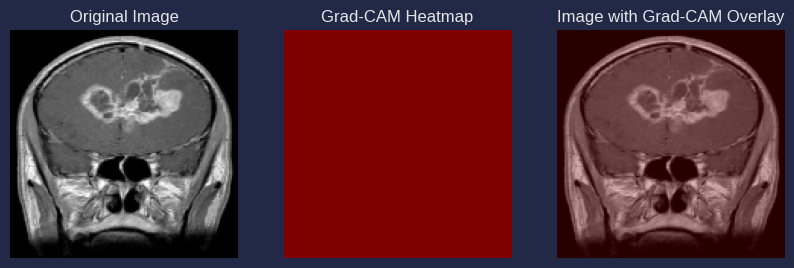

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Load the pre-trained (and trained) model
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')  # Update with your path

# Path to the image you want to use for Grad-CAM
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'

# Load and preprocess the image
input_image = image.load_img(image_path, target_size=(150, 150))  # Resize image to fit model input
input_array = image.img_to_array(input_image)
input_array = np.expand_dims(input_array, axis=0)  # Add batch dimension
input_array = input_array / 255.0  # Normalize the image

# Convert the image to a tensor
input_tensor = tf.convert_to_tensor(input_array)

# Predict the class index for the given image
predictions = model.predict(input_tensor)
pred_index = np.argmax(predictions)  # Get the predicted class index

# Perform gradient computation using tf.GradientTape
with tf.GradientTape() as tape:
    tape.watch(input_tensor)  # Watch the tensor image
    predictions = model(input_tensor)  # Forward pass
    loss = predictions[:, pred_index]  # Get the score for the predicted class

# Compute the gradients of the loss with respect to the input image
grads = tape.gradient(loss, input_tensor)

# Generate the Grad-CAM heatmap by reducing along the channels axis
heatmap = tf.reduce_max(tf.abs(grads), axis=-1)

# Normalize and resize heatmap to match the original image size
heatmap = np.uint8(255 * heatmap[0])  # Convert to [0, 255] for visualization
heatmap = np.expand_dims(heatmap, axis=-1)  # Add channel dimension
heatmap = tf.image.resize(heatmap, (input_image.size[1], input_image.size[0]))  # Resize to match input image

# Convert the heatmap to a format that OpenCV can handle
heatmap_resized = np.squeeze(heatmap.numpy(), axis=-1)  # Remove the last dimension (channel)
heatmap_resized = np.uint8(heatmap_resized)  # Convert to 8-bit format

# Apply the color map to the heatmap
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)  # Apply color map to image

# Resize the original image to match the heatmap
original_image_resized = np.uint8(255 * input_array[0])  # Rescale input image to [0, 255] for overlay
original_image_resized = cv2.cvtColor(original_image_resized, cv2.COLOR_RGB2BGR)  # Convert to BGR for OpenCV

# Overlay the heatmap on the original image
overlayed_image = cv2.addWeighted(original_image_resized, 0.7, heatmap_resized, 0.3, 0)  # Overlay heatmap on image

# Display the results
plt.figure(figsize=(10, 10))

# Display original image
plt.subplot(1, 3, 1)
plt.imshow(input_image)
plt.title("Original Image")
plt.axis('off')

# Display Grad-CAM heatmap
plt.subplot(1, 3, 2)
plt.imshow(heatmap_resized, cmap='jet')
plt.title("Grad-CAM Heatmap")
plt.axis('off')

# Display overlayed image (Original + Heatmap)
plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title("Image with Grad-CAM Overlay")
plt.axis('off')

plt.show()


In [ ]:
import cv2
import numpy as np

def detect_tumor(image):
    # This is just a placeholder. You can use a pre-trained model like Mask R-CNN for tumor segmentation.
    # Example: Let's assume the tumor is in a rectangle region (x1, y1, x2, y2)
    tumor_bbox = (100, 100, 200, 200)  # (x1, y1, x2, y2) - Update this with actual tumor region
    tumor_region = image[tumor_bbox[1]:tumor_bbox[3], tumor_bbox[0]:tumor_bbox[2]]
    return tumor_region, tumor_bbox


In [ ]:
import tensorflow as tf

def super_resolution(image):
    # Load the super-resolution model (SRCNN or any other model)
    model_path = '/content/drive/MyDrive/Major_Project1/super_resolution_model.h5'  # Update with correct path
    model = tf.keras.models.load_model(model_path)

    low_res_image = tf.image.resize(image, (image.shape[0] * 2, image.shape[1] * 2))  # Resize to simulate LR
    low_res_image = low_res_image / 255.0  # Normalize

    # Enhance image resolution using SRCNN model
    enhanced_image = model.predict(np.expand_dims(low_res_image, axis=0))
    enhanced_image = np.squeeze(enhanced_image, axis=0)
    enhanced_image = np.clip(enhanced_image * 255.0, 0, 255).astype(np.uint8)
    return enhanced_image


In [ ]:
import cv2
import numpy as np

def enhance_tumor_basic(image):
    # Resize the tumor region to increase the resolution (this is a simple approach)
    enhanced_tumor = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

    # Apply sharpening (optional)
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])  # Simple sharpening kernel
    enhanced_tumor = cv2.filter2D(enhanced_tumor, -1, kernel)

    return enhanced_tumor

# Example usage
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'  # Replace with actual image path
image = cv2.imread(image_path)

tumor_region, tumor_bbox = detect_tumor(image)  # Assuming you have a function to detect tumor
enhanced_tumor = enhance_tumor_basic(tumor_region)
enhanced_image = insert_enhanced_tumor(image, enhanced_tumor, tumor_bbox)

# Display enhanced image
cv2.imshow('Enhanced Image', enhanced_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


NameError: name 'insert_enhanced_tumor' is not defined

In [ ]:
import cv2
import numpy as np

# Function to enhance the tumor region
def enhance_tumor_basic(image):
    # Resize the tumor region to increase the resolution (this is a simple approach)
    enhanced_tumor = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

    # Apply sharpening (optional)
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])  # Simple sharpening kernel
    enhanced_tumor = cv2.filter2D(enhanced_tumor, -1, kernel)

    return enhanced_tumor

# Function to detect tumor (dummy implementation for illustration)
def detect_tumor(image):
    # Example of a simple bounding box for the tumor (In practice, you can use an object detection model)
    height, width, _ = image.shape
    tumor_bbox = (100, 100, 200, 200)  # (x, y, width, height) of the tumor region
    tumor_region = image[tumor_bbox[1]:tumor_bbox[1]+tumor_bbox[3], tumor_bbox[0]:tumor_bbox[0]+tumor_bbox[2]]
    return tumor_region, tumor_bbox

# Function to insert the enhanced tumor back into the original image
def insert_enhanced_tumor(original_image, enhanced_tumor, tumor_bbox):
    x, y, w, h = tumor_bbox
    # Resize the enhanced tumor back to the original size
    enhanced_tumor_resized = cv2.resize(enhanced_tumor, (w, h))

    # Insert the enhanced tumor into the original image
    original_image[y:y+h, x:x+w] = enhanced_tumor_resized
    return original_image

# Example usage
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'  # Replace with actual image path
image = cv2.imread(image_path)

tumor_region, tumor_bbox = detect_tumor(image)  # Detect tumor region
enhanced_tumor = enhance_tumor_basic(tumor_region)  # Use basic enhancement method (resize & sharpen)
enhanced_image = insert_enhanced_tumor(image, enhanced_tumor, tumor_bbox)  # Insert enhanced tumor back into image

# Display the enhanced image
cv2.imshow('Enhanced Image', enhanced_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


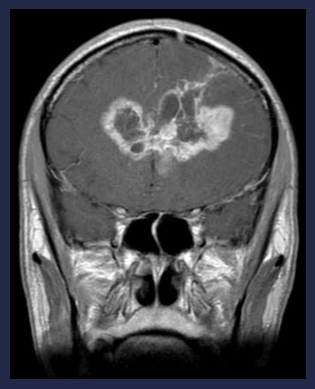

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to enhance the tumor region
def enhance_tumor_basic(image):
    # Resize the tumor region to increase the resolution (this is a simple approach)
    enhanced_tumor = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

    # Apply sharpening (optional)
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])  # Simple sharpening kernel
    enhanced_tumor = cv2.filter2D(enhanced_tumor, -1, kernel)

    return enhanced_tumor

# Function to detect tumor (dummy implementation for illustration)
def detect_tumor(image):
    # Example of a simple bounding box for the tumor (In practice, you can use an object detection model)
    height, width, _ = image.shape
    tumor_bbox = (100, 100, 200, 200)  # (x, y, width, height) of the tumor region
    tumor_region = image[tumor_bbox[1]:tumor_bbox[1]+tumor_bbox[3], tumor_bbox[0]:tumor_bbox[0]+tumor_bbox[2]]
    return tumor_region, tumor_bbox

# Function to insert the enhanced tumor back into the original image
def insert_enhanced_tumor(original_image, enhanced_tumor, tumor_bbox):
    x, y, w, h = tumor_bbox
    # Resize the enhanced tumor back to the original size
    enhanced_tumor_resized = cv2.resize(enhanced_tumor, (w, h))

    # Insert the enhanced tumor into the original image
    original_image[y:y+h, x:x+w] = enhanced_tumor_resized
    return original_image

# Example usage
image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'  # Replace with actual image path
image = cv2.imread(image_path)

tumor_region, tumor_bbox = detect_tumor(image)  # Detect tumor region
enhanced_tumor = enhance_tumor_basic(tumor_region)  # Use basic enhancement method (resize & sharpen)
enhanced_image = insert_enhanced_tumor(image, enhanced_tumor, tumor_bbox)  # Insert enhanced tumor back into image

# Display the enhanced image using matplotlib
plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct color display
plt.axis('off')  # Turn off axis labels
plt.show()


In [ ]:
# Load your model (if using model.save() and model.load_model())
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')

# Recompile the model with the same optimizer, loss, and metrics as before
model.compile(optimizer='adam',  # Choose the same optimizer used previously
              loss='binary_crossentropy',  # Choose the same loss function used previously
              metrics=['accuracy'])  # Use the same metrics you want to track


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assuming 'enhanced_image' is the image with the enhanced tumor region
# Resize the enhanced image to the input size of the model
model_input_size = (150, 150)  # Replace with your model's input size if different
enhanced_image_resized = cv2.resize(enhanced_image, model_input_size)  # Resize to model input size

# Normalize the image (if your model expects it)
enhanced_image_preprocessed = enhanced_image_resized / 255.0  # Normalize

# Add batch dimension (model expects batch input)
enhanced_image_input = np.expand_dims(enhanced_image_preprocessed, axis=0)

# Load your trained model
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5')  # Replace with the actual path

# Predict the class
prediction = model.predict(enhanced_image_input)
predicted_class = np.argmax(prediction)  # Get the class with the highest probability

# Print the prediction result
print(f"Predicted Class Index: {predicted_class}")
print(f"Prediction Probabilities: {prediction}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 27s 27s/step
Predicted Class Index: 1
Prediction Probabilities: [[2.3506430e-04 9.9844426e-01 1.2162054e-03 1.0446963e-04]]


In [ ]:
from tensorflow.keras.models import load_model

# Load the trained model from the specified path
model_path = '/content/drive/MyDrive/Major_Project1/efficientnetB0_model.h5'
model = load_model(model_path)


In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image

def get_uncertain_samples(model, images, top_n=5):
    """
    Returns the most uncertain samples based on entropy.

    :param model: Trained model
    :param images: List or array of images to evaluate
    :param top_n: Number of uncertain samples to return
    :return: Indices of uncertain samples
    """
    uncertain_indices = []
    entropy_values = []

    # For each image, compute entropy of the prediction
    for img in images:
        # Preprocess the image
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)  # Add batch dimension

        # Get model predictions (probabilities)
        probs = model.predict(img)[0]

        # Calculate entropy: -sum(p * log(p))
        entropy = -np.sum(probs * np.log(probs + 1e-10))  # Adding small epsilon to avoid log(0)
        entropy_values.append(entropy)

    # Get the indices of the top_n most uncertain samples
    uncertain_indices = np.argsort(entropy_values)[-top_n:]

    return uncertain_indices


SHAP

In [ ]:
pip install shap


In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained EfficientNetB0 model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/densenet_model.h5'
model = tf.keras.models.load_model('/content/drive/MyDrive/Major_Project1/densenet_model.h5')

# Specify the last convolutional layer name (for EfficientNetB0, usually 'top_conv')
last_conv_layer_name = "top_conv"  # For EfficientNetB0, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


ValueError: No such layer: top_conv. Existing layers are: ['input_layer_3', 'zero_padding2d', 'conv1_conv', 'conv1_bn', 'conv1_relu', 'zero_padding2d_1', 'pool1', 'conv2_block1_0_bn', 'conv2_block1_0_relu', 'conv2_block1_1_conv', 'conv2_block1_1_bn', 'conv2_block1_1_relu', 'conv2_block1_2_conv', 'conv2_block1_concat', 'conv2_block2_0_bn', 'conv2_block2_0_relu', 'conv2_block2_1_conv', 'conv2_block2_1_bn', 'conv2_block2_1_relu', 'conv2_block2_2_conv', 'conv2_block2_concat', 'conv2_block3_0_bn', 'conv2_block3_0_relu', 'conv2_block3_1_conv', 'conv2_block3_1_bn', 'conv2_block3_1_relu', 'conv2_block3_2_conv', 'conv2_block3_concat', 'conv2_block4_0_bn', 'conv2_block4_0_relu', 'conv2_block4_1_conv', 'conv2_block4_1_bn', 'conv2_block4_1_relu', 'conv2_block4_2_conv', 'conv2_block4_concat', 'conv2_block5_0_bn', 'conv2_block5_0_relu', 'conv2_block5_1_conv', 'conv2_block5_1_bn', 'conv2_block5_1_relu', 'conv2_block5_2_conv', 'conv2_block5_concat', 'conv2_block6_0_bn', 'conv2_block6_0_relu', 'conv2_block6_1_conv', 'conv2_block6_1_bn', 'conv2_block6_1_relu', 'conv2_block6_2_conv', 'conv2_block6_concat', 'pool2_bn', 'pool2_relu', 'pool2_conv', 'pool2_pool', 'conv3_block1_0_bn', 'conv3_block1_0_relu', 'conv3_block1_1_conv', 'conv3_block1_1_bn', 'conv3_block1_1_relu', 'conv3_block1_2_conv', 'conv3_block1_concat', 'conv3_block2_0_bn', 'conv3_block2_0_relu', 'conv3_block2_1_conv', 'conv3_block2_1_bn', 'conv3_block2_1_relu', 'conv3_block2_2_conv', 'conv3_block2_concat', 'conv3_block3_0_bn', 'conv3_block3_0_relu', 'conv3_block3_1_conv', 'conv3_block3_1_bn', 'conv3_block3_1_relu', 'conv3_block3_2_conv', 'conv3_block3_concat', 'conv3_block4_0_bn', 'conv3_block4_0_relu', 'conv3_block4_1_conv', 'conv3_block4_1_bn', 'conv3_block4_1_relu', 'conv3_block4_2_conv', 'conv3_block4_concat', 'conv3_block5_0_bn', 'conv3_block5_0_relu', 'conv3_block5_1_conv', 'conv3_block5_1_bn', 'conv3_block5_1_relu', 'conv3_block5_2_conv', 'conv3_block5_concat', 'conv3_block6_0_bn', 'conv3_block6_0_relu', 'conv3_block6_1_conv', 'conv3_block6_1_bn', 'conv3_block6_1_relu', 'conv3_block6_2_conv', 'conv3_block6_concat', 'conv3_block7_0_bn', 'conv3_block7_0_relu', 'conv3_block7_1_conv', 'conv3_block7_1_bn', 'conv3_block7_1_relu', 'conv3_block7_2_conv', 'conv3_block7_concat', 'conv3_block8_0_bn', 'conv3_block8_0_relu', 'conv3_block8_1_conv', 'conv3_block8_1_bn', 'conv3_block8_1_relu', 'conv3_block8_2_conv', 'conv3_block8_concat', 'conv3_block9_0_bn', 'conv3_block9_0_relu', 'conv3_block9_1_conv', 'conv3_block9_1_bn', 'conv3_block9_1_relu', 'conv3_block9_2_conv', 'conv3_block9_concat', 'conv3_block10_0_bn', 'conv3_block10_0_relu', 'conv3_block10_1_conv', 'conv3_block10_1_bn', 'conv3_block10_1_relu', 'conv3_block10_2_conv', 'conv3_block10_concat', 'conv3_block11_0_bn', 'conv3_block11_0_relu', 'conv3_block11_1_conv', 'conv3_block11_1_bn', 'conv3_block11_1_relu', 'conv3_block11_2_conv', 'conv3_block11_concat', 'conv3_block12_0_bn', 'conv3_block12_0_relu', 'conv3_block12_1_conv', 'conv3_block12_1_bn', 'conv3_block12_1_relu', 'conv3_block12_2_conv', 'conv3_block12_concat', 'pool3_bn', 'pool3_relu', 'pool3_conv', 'pool3_pool', 'conv4_block1_0_bn', 'conv4_block1_0_relu', 'conv4_block1_1_conv', 'conv4_block1_1_bn', 'conv4_block1_1_relu', 'conv4_block1_2_conv', 'conv4_block1_concat', 'conv4_block2_0_bn', 'conv4_block2_0_relu', 'conv4_block2_1_conv', 'conv4_block2_1_bn', 'conv4_block2_1_relu', 'conv4_block2_2_conv', 'conv4_block2_concat', 'conv4_block3_0_bn', 'conv4_block3_0_relu', 'conv4_block3_1_conv', 'conv4_block3_1_bn', 'conv4_block3_1_relu', 'conv4_block3_2_conv', 'conv4_block3_concat', 'conv4_block4_0_bn', 'conv4_block4_0_relu', 'conv4_block4_1_conv', 'conv4_block4_1_bn', 'conv4_block4_1_relu', 'conv4_block4_2_conv', 'conv4_block4_concat', 'conv4_block5_0_bn', 'conv4_block5_0_relu', 'conv4_block5_1_conv', 'conv4_block5_1_bn', 'conv4_block5_1_relu', 'conv4_block5_2_conv', 'conv4_block5_concat', 'conv4_block6_0_bn', 'conv4_block6_0_relu', 'conv4_block6_1_conv', 'conv4_block6_1_bn', 'conv4_block6_1_relu', 'conv4_block6_2_conv', 'conv4_block6_concat', 'conv4_block7_0_bn', 'conv4_block7_0_relu', 'conv4_block7_1_conv', 'conv4_block7_1_bn', 'conv4_block7_1_relu', 'conv4_block7_2_conv', 'conv4_block7_concat', 'conv4_block8_0_bn', 'conv4_block8_0_relu', 'conv4_block8_1_conv', 'conv4_block8_1_bn', 'conv4_block8_1_relu', 'conv4_block8_2_conv', 'conv4_block8_concat', 'conv4_block9_0_bn', 'conv4_block9_0_relu', 'conv4_block9_1_conv', 'conv4_block9_1_bn', 'conv4_block9_1_relu', 'conv4_block9_2_conv', 'conv4_block9_concat', 'conv4_block10_0_bn', 'conv4_block10_0_relu', 'conv4_block10_1_conv', 'conv4_block10_1_bn', 'conv4_block10_1_relu', 'conv4_block10_2_conv', 'conv4_block10_concat', 'conv4_block11_0_bn', 'conv4_block11_0_relu', 'conv4_block11_1_conv', 'conv4_block11_1_bn', 'conv4_block11_1_relu', 'conv4_block11_2_conv', 'conv4_block11_concat', 'conv4_block12_0_bn', 'conv4_block12_0_relu', 'conv4_block12_1_conv', 'conv4_block12_1_bn', 'conv4_block12_1_relu', 'conv4_block12_2_conv', 'conv4_block12_concat', 'conv4_block13_0_bn', 'conv4_block13_0_relu', 'conv4_block13_1_conv', 'conv4_block13_1_bn', 'conv4_block13_1_relu', 'conv4_block13_2_conv', 'conv4_block13_concat', 'conv4_block14_0_bn', 'conv4_block14_0_relu', 'conv4_block14_1_conv', 'conv4_block14_1_bn', 'conv4_block14_1_relu', 'conv4_block14_2_conv', 'conv4_block14_concat', 'conv4_block15_0_bn', 'conv4_block15_0_relu', 'conv4_block15_1_conv', 'conv4_block15_1_bn', 'conv4_block15_1_relu', 'conv4_block15_2_conv', 'conv4_block15_concat', 'conv4_block16_0_bn', 'conv4_block16_0_relu', 'conv4_block16_1_conv', 'conv4_block16_1_bn', 'conv4_block16_1_relu', 'conv4_block16_2_conv', 'conv4_block16_concat', 'conv4_block17_0_bn', 'conv4_block17_0_relu', 'conv4_block17_1_conv', 'conv4_block17_1_bn', 'conv4_block17_1_relu', 'conv4_block17_2_conv', 'conv4_block17_concat', 'conv4_block18_0_bn', 'conv4_block18_0_relu', 'conv4_block18_1_conv', 'conv4_block18_1_bn', 'conv4_block18_1_relu', 'conv4_block18_2_conv', 'conv4_block18_concat', 'conv4_block19_0_bn', 'conv4_block19_0_relu', 'conv4_block19_1_conv', 'conv4_block19_1_bn', 'conv4_block19_1_relu', 'conv4_block19_2_conv', 'conv4_block19_concat', 'conv4_block20_0_bn', 'conv4_block20_0_relu', 'conv4_block20_1_conv', 'conv4_block20_1_bn', 'conv4_block20_1_relu', 'conv4_block20_2_conv', 'conv4_block20_concat', 'conv4_block21_0_bn', 'conv4_block21_0_relu', 'conv4_block21_1_conv', 'conv4_block21_1_bn', 'conv4_block21_1_relu', 'conv4_block21_2_conv', 'conv4_block21_concat', 'conv4_block22_0_bn', 'conv4_block22_0_relu', 'conv4_block22_1_conv', 'conv4_block22_1_bn', 'conv4_block22_1_relu', 'conv4_block22_2_conv', 'conv4_block22_concat', 'conv4_block23_0_bn', 'conv4_block23_0_relu', 'conv4_block23_1_conv', 'conv4_block23_1_bn', 'conv4_block23_1_relu', 'conv4_block23_2_conv', 'conv4_block23_concat', 'conv4_block24_0_bn', 'conv4_block24_0_relu', 'conv4_block24_1_conv', 'conv4_block24_1_bn', 'conv4_block24_1_relu', 'conv4_block24_2_conv', 'conv4_block24_concat', 'pool4_bn', 'pool4_relu', 'pool4_conv', 'pool4_pool', 'conv5_block1_0_bn', 'conv5_block1_0_relu', 'conv5_block1_1_conv', 'conv5_block1_1_bn', 'conv5_block1_1_relu', 'conv5_block1_2_conv', 'conv5_block1_concat', 'conv5_block2_0_bn', 'conv5_block2_0_relu', 'conv5_block2_1_conv', 'conv5_block2_1_bn', 'conv5_block2_1_relu', 'conv5_block2_2_conv', 'conv5_block2_concat', 'conv5_block3_0_bn', 'conv5_block3_0_relu', 'conv5_block3_1_conv', 'conv5_block3_1_bn', 'conv5_block3_1_relu', 'conv5_block3_2_conv', 'conv5_block3_concat', 'conv5_block4_0_bn', 'conv5_block4_0_relu', 'conv5_block4_1_conv', 'conv5_block4_1_bn', 'conv5_block4_1_relu', 'conv5_block4_2_conv', 'conv5_block4_concat', 'conv5_block5_0_bn', 'conv5_block5_0_relu', 'conv5_block5_1_conv', 'conv5_block5_1_bn', 'conv5_block5_1_relu', 'conv5_block5_2_conv', 'conv5_block5_concat', 'conv5_block6_0_bn', 'conv5_block6_0_relu', 'conv5_block6_1_conv', 'conv5_block6_1_bn', 'conv5_block6_1_relu', 'conv5_block6_2_conv', 'conv5_block6_concat', 'conv5_block7_0_bn', 'conv5_block7_0_relu', 'conv5_block7_1_conv', 'conv5_block7_1_bn', 'conv5_block7_1_relu', 'conv5_block7_2_conv', 'conv5_block7_concat', 'conv5_block8_0_bn', 'conv5_block8_0_relu', 'conv5_block8_1_conv', 'conv5_block8_1_bn', 'conv5_block8_1_relu', 'conv5_block8_2_conv', 'conv5_block8_concat', 'conv5_block9_0_bn', 'conv5_block9_0_relu', 'conv5_block9_1_conv', 'conv5_block9_1_bn', 'conv5_block9_1_relu', 'conv5_block9_2_conv', 'conv5_block9_concat', 'conv5_block10_0_bn', 'conv5_block10_0_relu', 'conv5_block10_1_conv', 'conv5_block10_1_bn', 'conv5_block10_1_relu', 'conv5_block10_2_conv', 'conv5_block10_concat', 'conv5_block11_0_bn', 'conv5_block11_0_relu', 'conv5_block11_1_conv', 'conv5_block11_1_bn', 'conv5_block11_1_relu', 'conv5_block11_2_conv', 'conv5_block11_concat', 'conv5_block12_0_bn', 'conv5_block12_0_relu', 'conv5_block12_1_conv', 'conv5_block12_1_bn', 'conv5_block12_1_relu', 'conv5_block12_2_conv', 'conv5_block12_concat', 'conv5_block13_0_bn', 'conv5_block13_0_relu', 'conv5_block13_1_conv', 'conv5_block13_1_bn', 'conv5_block13_1_relu', 'conv5_block13_2_conv', 'conv5_block13_concat', 'conv5_block14_0_bn', 'conv5_block14_0_relu', 'conv5_block14_1_conv', 'conv5_block14_1_bn', 'conv5_block14_1_relu', 'conv5_block14_2_conv', 'conv5_block14_concat', 'conv5_block15_0_bn', 'conv5_block15_0_relu', 'conv5_block15_1_conv', 'conv5_block15_1_bn', 'conv5_block15_1_relu', 'conv5_block15_2_conv', 'conv5_block15_concat', 'conv5_block16_0_bn', 'conv5_block16_0_relu', 'conv5_block16_1_conv', 'conv5_block16_1_bn', 'conv5_block16_1_relu', 'conv5_block16_2_conv', 'conv5_block16_concat', 'bn', 'relu', 'global_average_pooling2d_3', 'dropout_3', 'dense_5'].

<Figure size 1500x1000 with 0 Axes>

In [ ]:
# Print the names of all layers in the model
for layer in model.layers:
    print(layer.name)


input_layer_3
zero_padding2d
conv1_conv
conv1_bn
conv1_relu
zero_padding2d_1
pool1
conv2_block1_0_bn
conv2_block1_0_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_concat
conv2_block2_0_bn
conv2_block2_0_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_concat
conv2_block3_0_bn
conv2_block3_0_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_concat
conv2_block4_0_bn
conv2_block4_0_relu
conv2_block4_1_conv
conv2_block4_1_bn
conv2_block4_1_relu
conv2_block4_2_conv
conv2_block4_concat
conv2_block5_0_bn
conv2_block5_0_relu
conv2_block5_1_conv
conv2_block5_1_bn
conv2_block5_1_relu
conv2_block5_2_conv
conv2_block5_concat
conv2_block6_0_bn
conv2_block6_0_relu
conv2_block6_1_conv
conv2_block6_1_bn
conv2_block6_1_relu
conv2_block6_2_conv
conv2_block6_concat
pool2_bn
pool2_relu
pool2_conv
pool2_pool
conv3_block1_0_bn
conv3_block1_0_relu
conv3_block1_1_conv
c

In [ ]:
last_conv_layer_name = "conv5_block5_2_conv"  # Replace with the correct layer name


input_layer_3
zero_padding2d
conv1_conv
conv1_bn
conv1_relu
zero_padding2d_1
pool1
conv2_block1_0_bn
conv2_block1_0_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_concat
conv2_block2_0_bn
conv2_block2_0_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_concat
conv2_block3_0_bn
conv2_block3_0_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_concat
conv2_block4_0_bn
conv2_block4_0_relu
conv2_block4_1_conv
conv2_block4_1_bn
conv2_block4_1_relu
conv2_block4_2_conv
conv2_block4_concat
conv2_block5_0_bn
conv2_block5_0_relu
conv2_block5_1_conv
conv2_block5_1_bn
conv2_block5_1_relu
conv2_block5_2_conv
conv2_block5_concat
conv2_block6_0_bn
conv2_block6_0_relu
conv2_block6_1_conv
conv2_block6_1_bn
conv2_block6_1_relu
conv2_block6_2_conv
conv2_block6_concat
pool2_bn
pool2_relu
pool2_conv
pool2_pool
conv3_block1_0_bn
conv3_block1_0_relu
conv3_block1_1_conv
c

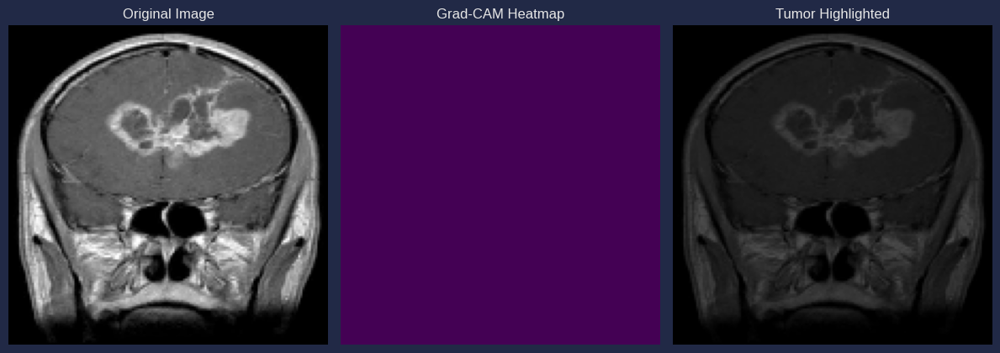

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained model
model_path = '/content/drive/MyDrive/Major_Project1/densenet_model.h5'
model = tf.keras.models.load_model(model_path)

# Print the names of all layers in the model to identify the last conv layer
for layer in model.layers:
    print(layer.name)

# Set the correct last convolution layer name (replace with the correct layer name)
last_conv_layer_name = "conv5_block5_2_conv"  # Example, change according to your model's layers

# Example test image from your test set
test_image_path = '/content/drive/MyDrive/Major_Project1/Testing/glioma_tumor/image.jpg'  # Replace with your image path
image_obj = image.load_img(test_image_path, target_size=(150, 150))  # Resize to match model input size
preprocessed_image = preprocess_image(image_obj)

# Generate Grad-CAM heatmap
heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

# Isolate and color only the tumor region based on heatmap
original_image = np.array(image_obj)  # Convert to array for visualization
overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

# Display the original image, heatmap, and tumor-highlighted image
plt.figure(figsize=(12, 8))

# Plot original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis("off")

# Plot Grad-CAM heatmap
plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap="viridis")
plt.title("Grad-CAM Heatmap")
plt.axis("off")

# Plot tumor-highlighted image
plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title("Tumor Highlighted")
plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 30s 30s/step
Predicted class for image 1: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Predicted class for image 2: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Predicted class for image 3: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Predicted class for image 4: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Predicted class for image 5: [1]


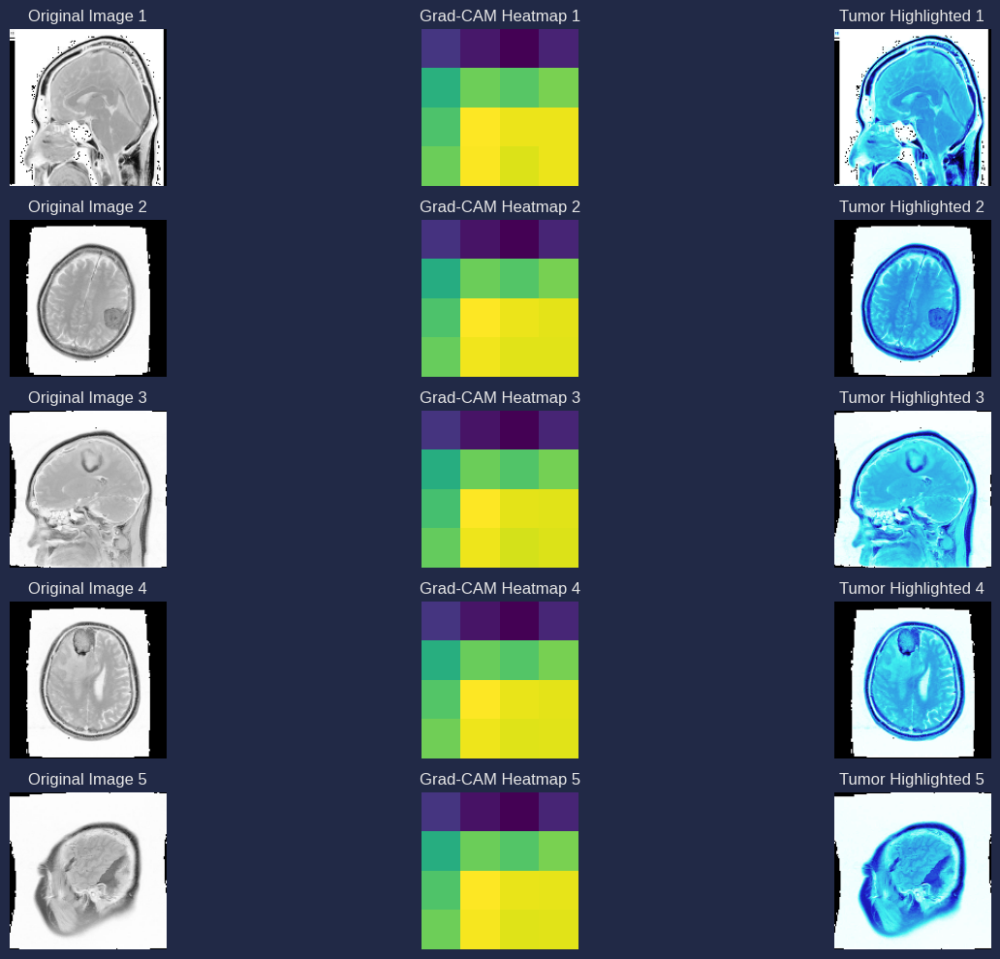

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image
def preprocess_image(img, img_size=(150, 150)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained DenseNet model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/densenet_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the correct last convolutional layer name for DenseNet (found from model inspection)
last_conv_layer_name = "conv5_block16_0_bn"  # Replace this with the actual name of the last conv layer in your model

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for model input
    preprocessed_image = np.expand_dims(test_image, axis=0)  # Add batch dimension
    preprocessed_image = preprocessed_image / 255.0  # Normalize the image

    # Check model prediction
    predictions = model.predict(preprocessed_image)
    predicted_class = np.argmax(predictions, axis=1)
    print(f"Predicted class for image {i+1}: {predicted_class}")

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.5, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
Predicted class for image 1: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Predicted class for image 2: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted class for image 3: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Predicted class for image 4: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Predicted class for image 5: [1]


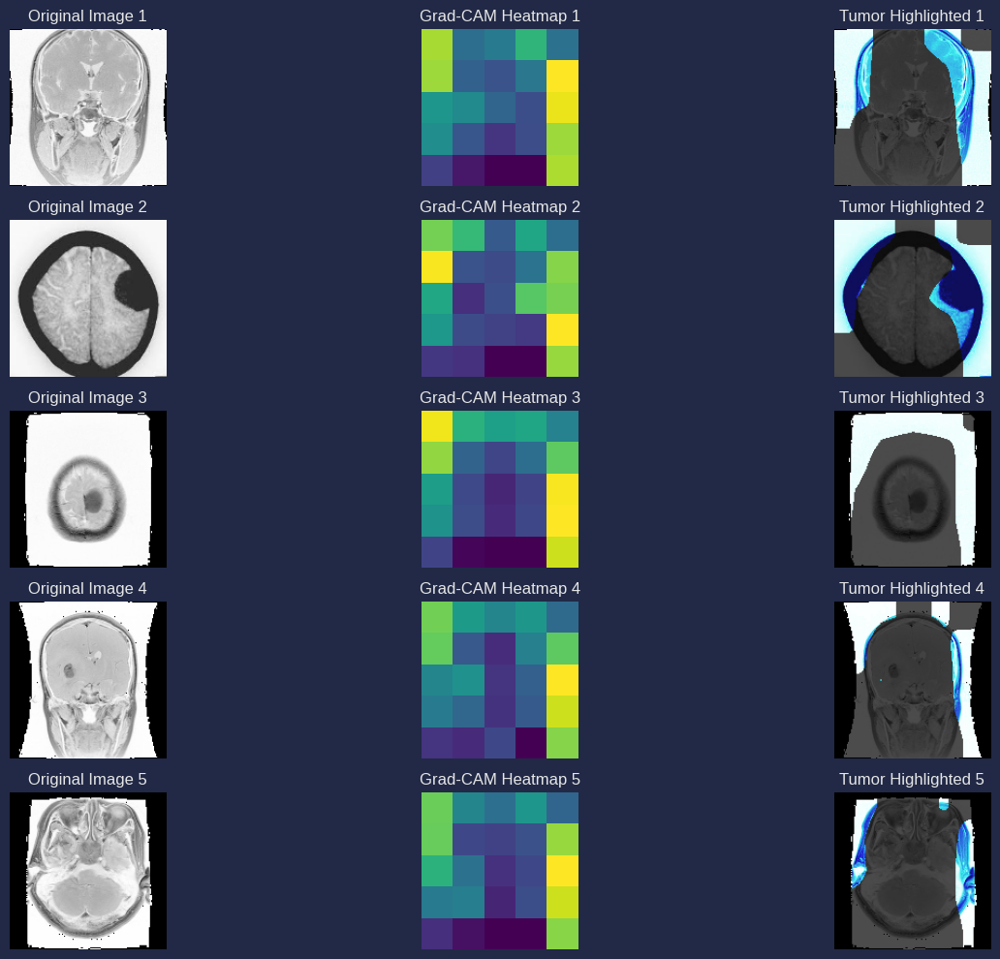

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image for ResNet101 (ImageNet normalization)
def preprocess_image_resnet(img, img_size=(224, 224)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = tf.keras.applications.resnet.preprocess_input(img_array)  # ResNet specific preprocessing
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained ResNet101 model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/resnet101_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name for ResNet101 (found from model inspection)
last_conv_layer_name = "conv5_block3_out"  # For ResNet101, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for ResNet101 input
    preprocessed_image = preprocess_image_resnet(test_image)  # Preprocess with ResNet method

    # Check model prediction
    predictions = model.predict(preprocessed_image)
    predicted_class = np.argmax(predictions, axis=1)
    print(f"Predicted class for image {i+1}: {predicted_class}")

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.5, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
Predicted class for image 1: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Predicted class for image 2: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted class for image 3: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted class for image 4: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predicted class for image 5: [1]


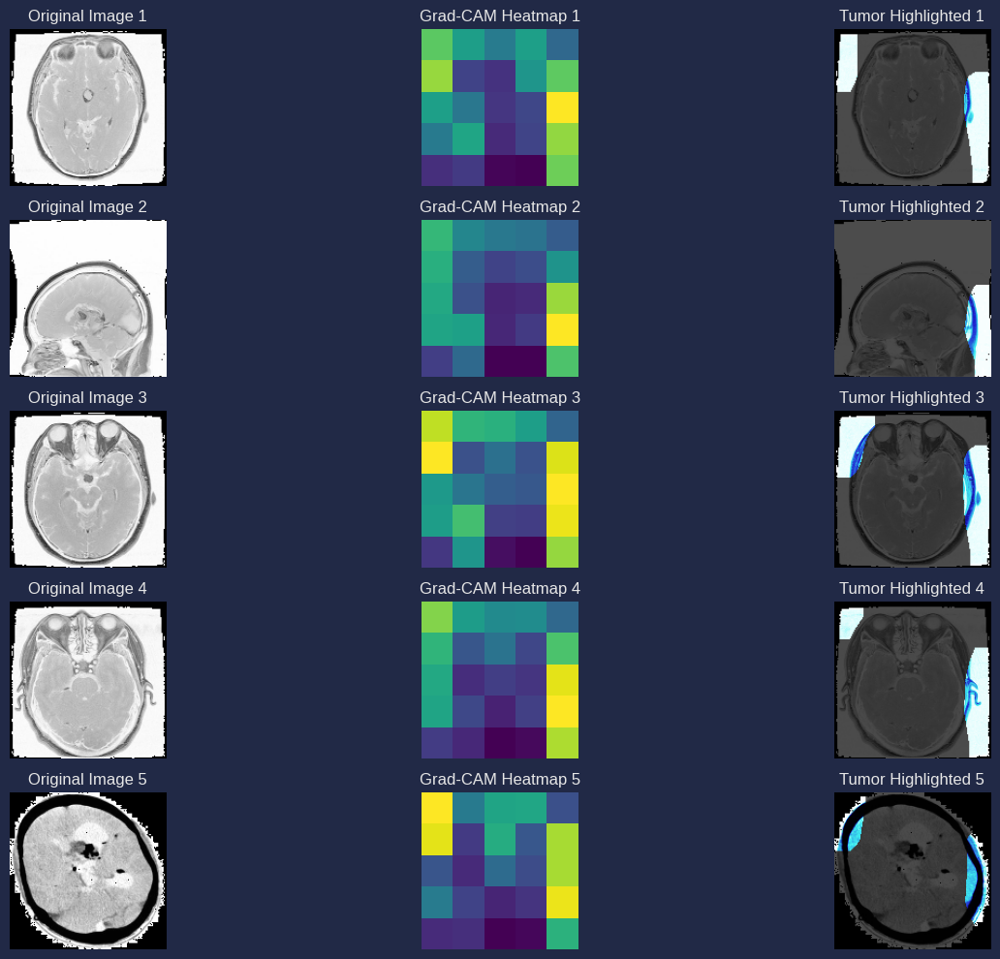

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image for ResNet101 (ImageNet normalization)
def preprocess_image_resnet(img, img_size=(224, 224)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = tf.keras.applications.resnet.preprocess_input(img_array)  # ResNet specific preprocessing
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.6, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained ResNet101 model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/resnet101_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name for ResNet101 (found from model inspection)
last_conv_layer_name = "conv5_block3_out"  # For ResNet101, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for ResNet101 input
    preprocessed_image = preprocess_image_resnet(test_image)  # Preprocess with ResNet method

    # Check model prediction
    predictions = model.predict(preprocessed_image)
    predicted_class = np.argmax(predictions, axis=1)
    print(f"Predicted class for image {i+1}: {predicted_class}")

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 53s 53s/step
Predicted class for image 1: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted class for image 2: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted class for image 3: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted class for image 4: [1]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step
Predicted class for image 5: [1]


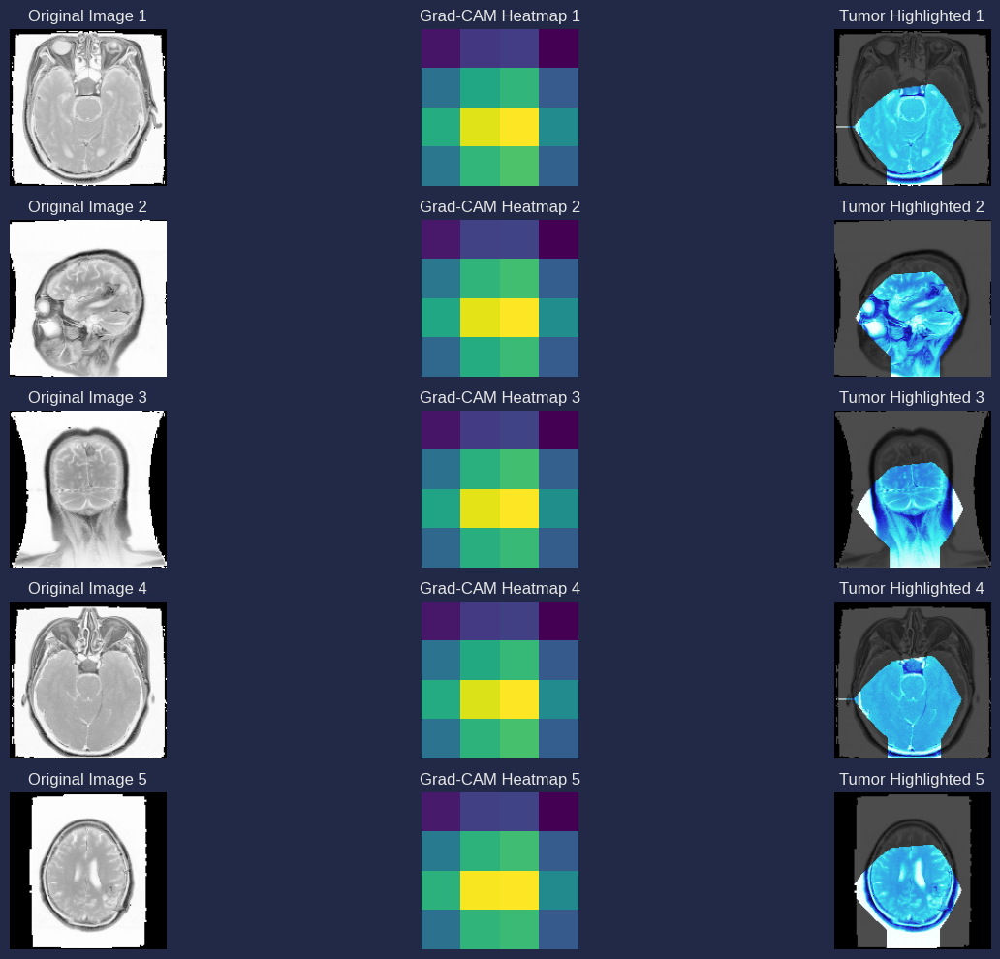

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image

# Helper function to preprocess the image for DenseNet (ImageNet normalization)
def preprocess_image_densenet(img, img_size=(224, 224)):
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = tf.keras.applications.densenet.preprocess_input(img_array)  # DenseNet specific preprocessing
    return img_array

# Grad-CAM function to generate heatmap
def grad_cam(model, image, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Compute the activations and predictions
        conv_outputs, predictions = grad_model(image)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Default to the predicted class
        class_channel = predictions[:, pred_index]

    # Compute gradients of the class output w.r.t. conv layer output
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Pool gradients

    # Multiply each feature map in the conv layer by the mean gradient
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize the heatmap
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]
    return heatmap  # Return heatmap as NumPy array

# Helper function to isolate tumor region in heatmap
def isolate_tumor_region(heatmap, img, threshold=0.7, alpha=0.7):
    """
    Isolate and color the tumor region only.
    """
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply a threshold to keep only the tumor (high-confidence) regions
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit values
    mask = heatmap > (threshold * 255)  # Create mask for high-intensity areas

    # Use the mask to isolate the tumor region in the heatmap
    isolated_heatmap = np.zeros_like(img)  # Create an empty black image
    isolated_heatmap[mask] = img[mask]  # Copy the tumor region from the original image

    # Apply a colormap for the tumor area (hot colormap to emphasize the tumor)
    tumor_colored = cv2.applyColorMap(isolated_heatmap, cv2.COLORMAP_HOT)

    # Overlay tumor region on original image
    overlayed_img = cv2.addWeighted(img, 1 - alpha, tumor_colored, alpha, 0)
    return overlayed_img

# Load your pre-trained DenseNet model from your Google Drive
model_path = '/content/drive/MyDrive/Major_Project1/densenet_model.h5'
model = tf.keras.models.load_model(model_path)

# Specify the last convolutional layer name for DenseNet (you might need to adjust if using a different DenseNet version)
last_conv_layer_name = "conv5_block16_2_conv"  # For DenseNet121, this is typically the last convolution layer

# Pick multiple random images from your test set (e.g., pick 5 random images)
num_images = 5  # Change this to pick more or fewer images
random_indices = np.random.choice(len(X_test), num_images, replace=False)

# Plot multiple images with Grad-CAM and tumor highlights
plt.figure(figsize=(15, 10))

for i, idx in enumerate(random_indices):
    test_image = X_test[idx]
    original_image = np.uint8(test_image * 255)  # Convert to uint8 for display

    # Preprocess the image for DenseNet input
    preprocessed_image = preprocess_image_densenet(test_image)  # Preprocess with DenseNet method

    # Check model prediction
    predictions = model.predict(preprocessed_image)
    predicted_class = np.argmax(predictions, axis=1)
    print(f"Predicted class for image {i+1}: {predicted_class}")

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, preprocessed_image, last_conv_layer_name)

    # Isolate and color only the tumor region based on heatmap
    overlayed_image = isolate_tumor_region(heatmap, original_image, threshold=0.7, alpha=0.7)

    # Display the original image, heatmap, and tumor-highlighted image
    plt.subplot(num_images, 3, 3*i + 1)
    plt.imshow(original_image)
    plt.title(f"Original Image {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 2)
    plt.imshow(heatmap, cmap="viridis")
    plt.title(f"Grad-CAM Heatmap {i+1}")
    plt.axis("off")

    plt.subplot(num_images, 3, 3*i + 3)
    plt.imshow(overlayed_image)
    plt.title(f"Tumor Highlighted {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()
